In [129]:
import torch
import sys
import pyro

import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats
import pandas as pd

import numpy as np
import itertools

from pooledQTL import deconvolve, beta_model, gaussian_model, io_utils, asb_data

from importlib import reload

from pathlib import Path, PosixPath

fdr_threshold = 0.05
device = "cuda:0" if torch.cuda.is_available() else "cpu"
use_structured_guide = True # performs much better

In [130]:
from pathlib import PosixPath

 Load input RNA allelic counts.

In [131]:
rbps = ["24a-hNIL-control-tdp", "24a-hNIL-c9-tdp", "24a-hNIP-control-tdp", "24a-hNIP-c9-tdp"]
donors = [
    "CTRL-NEUHE723FGT-02545-G", "CASE-NEUFV237VCZ-01369-G",   
    "CTRL-NEUHE723FGT-02545-G", "CASE-NEUFV237VCZ-01369-G"]   
vcf = "/gpfs/commons/groups/knowles_lab/bindingQTL_share/genotype/chrAll_QCFinished_full_2sample.anno.vcf"
#vcf = "/gpfs/commons/groups/knowles_lab/bindingQTL_share/genotype/chrAll_QCFinished_full.anno.vcf"
basedir = Path("/gpfs/commons/home/dmeyer/bindingQTL_share")

In [4]:
input_files = [basedir / rbp / f"allelic/{rbp}_input_allelic.out" for rbp in rbps]
#input_files_filtered = [basedir / rbp / f"allelic/{rbp}_input_allelic.filtered_epsilon0.3.txt" for rbp in rbps]
input_files_filtered = [basedir / rbp / f"allelic/{rbp}_input_allelic.10readsInput_filtered_epsilon0.3_sharedhet.txt" for rbp in rbps]
IP_files = [basedir / rbp / f"allelic/{rbp}_ip_allelic.out" for rbp in rbps]
input_counts = [ pd.read_csv(f, sep = "\t", usecols = range(8), index_col = False) for f in input_files]
input_counts_filtered = [ pd.read_csv(f, sep = "\t", usecols = range(8), index_col = False) for f in input_files_filtered]
IP_counts = [ pd.read_csv(f, sep = "\t", usecols = range(8), index_col = False) for f in IP_files]

## Load imputed genotypes

In [5]:
#sanger = io_utils.loadGenotypes(
#    vcf,
#    maxlines = None, 
#    posterior = False,
#    print_every = 1e5,
#    add_chr_prefix="").rename(columns = {"SNP" : "variantID"})
#sanger.reset_index().to_feather(vcf + ".feather")

#sanger_feather = Path(vcf+".feather")
#sanger = pd.read_feather(sanger_feather).rename(columns = {"SNP" : "variantID"})
#del sanger["index"]
#sanger = sanger[sanger.variantID != "."]
#sanger = sanger[~sanger.variantID.duplicated()] # this removes triallelic SNPs, which I don't think we know how to handle anyway
#cols = list(sanger.columns)
#cols[0], cols[1] = cols[1], cols[0]
#sanger = sanger.loc[:,cols]
#sanger.reset_index().to_feather(vcf + ".feather")
sanger_feather = Path(vcf+".feather")
sanger = pd.read_feather(sanger_feather)
del sanger["index"]

In [6]:
sanger

,contig,position,variantID,refAllele,altAllele,CTRL-NEUHE723FGT-02545-G,CASE-NEUFV237VCZ-01369-G
0,chr1,770471,rs1033598197,T,C,0.0,0.0
1,chr1,778597,rs74512038,C,T,0.0,0.0
2,chr1,778602,rs377318662,T,C,0.0,0.0
3,chr1,778622,rs143219077,C,G,0.0,0.0
4,chr1,778809,rs186983562,A,G,0.0,0.0
...,...,...,...,...,...,...,...
36888227,chr22,50775215,rs144450696,C,G,0.0,0.0
36888228,chr22,50775255,rs185532268,C,T,0.0,0.0
36888229,chr22,50776939,rs1276126083,G,A,0.0,0.0
36888230,chr22,50780366,rs147736082,G,A,0.0,0.0


# Run Beta Model

First Load IP count data and join with input and genotype

In [7]:
from io import StringIO 
import sys

class Capturing(list):
    def __enter__(self):
        self._stdout = sys.stdout
        sys.stdout = self._stringio = StringIO()
        return self
    def __exit__(self, *args):
        self.extend(self._stringio.getvalue().splitlines())
        del self._stringio    # free up some memory
        sys.stdout = self._stdout


In [8]:
import polars as pl
import hvplot
hvplot.extension("matplotlib")

In [9]:
results_files = []
for i in range(4):
    results_dir = PosixPath(f'/gpfs/commons/home/dmeyer/bindingQTL_share/{rbps[i]}/allelic')
    results_file = results_dir / (f"{rbps[i]}_beta_10readsInput_filtered_epsilon0.3_ipreads30_allhet_struct.tsv.gz")
    results_files.append(results_file)

In [9]:
@np.vectorize
def f(x):
    a,b = x.split("] loss: ")
    a = int(a.strip("[iteration "))
    b = float(b)
    return a,b
loss_plots = []
for i in range(len(rbps)):
    dat = input_counts_filtered[i]
    dat_IP = IP_counts[i]
    sample_ind = donors[i]
    
    dat = dat.rename(columns={ "chrom":"contig" })
    dat = dat[dat.variantID != "."]
    dat = dat[~dat.variantID.duplicated()]
    dat_IP = dat_IP[dat_IP.variantID != "."]
    dat_IP = dat_IP[~dat_IP.variantID.duplicated()]
    
    imp_merged = sanger.merge(
        dat, 
        on = ["contig", "position", "variantID", "refAllele", "altAllele"]#, suffixes = ["_hg19",""]
    ) # sanger is GRCh38
    # there are only 0.08% flipped alleles so not worth doing.
    # np.isnan(imp_merged.iloc[:,5:16]).any() all False
    imp_merged["input_ratio"] = imp_merged.altCount / imp_merged.totalCount
    imp_merged = imp_merged[~imp_merged[sample_ind].isna()]
    imp_merged["pred_ratio"] = imp_merged.loc[:,sample_ind].to_numpy()
    merged = imp_merged.merge(
        dat_IP, 
        on = ("contig", "position", "variantID", "refAllele", "altAllele"), 
        suffixes = ("_input", "_IP"))
    #merged = merged.drop(labels=["contig_y", "position_x" ], axis=1)
    
    merged["IP_ratio"] = merged.altCount_IP / merged.totalCount_IP
    
    print(merged.shape)
    
    # filter for reasonable counts -- previous method
    #input_total_min = 10
    #allele_count_min = 4 
    #ip_total_min = 30
    #dat_sub = merged[merged.totalCount_input >= input_total_min]
    #dat_sub = dat_sub[dat_sub.refCount_input >= allele_count_min]
    #dat_sub = dat_sub[dat_sub.altCount_input >= allele_count_min]
    #dat_sub = dat_sub[dat_sub.totalCount_IP >= ip_total_min]
    #dat_sub = dat_sub[dat_sub.pred_ratio >= 0.45]
    #dat_sub = dat_sub[dat_sub.pred_ratio <= 0.55]
    
    ip_total_min = 30
    dat_sub = merged[merged.totalCount_IP >= ip_total_min]
    print(dat_sub.shape)
    
    epsilon = 0.3
    results_dir = PosixPath(f'/gpfs/commons/home/dmeyer/bindingQTL_share/{rbps[i]}/allelic')
    results_file = results_dir / (f"{rbps[i]}_beta_10readsInput_filtered_epsilon0.3_ipreads30_allhet_struct.tsv.gz")
    with Capturing() as output:
        results = beta_model.fit_and_save(dat_sub, 
                                         results_file,
                                         use_structured_guide = True,
                                         iterations = 1000,
                                         device = device)
    p = pl.DataFrame(np.array(f(output[:-1])).T, ["iteration", "loss"]).plot.scatter(x = "iteration", y = "loss")
    loss_plots.append(p)

(3788, 16)
(3788, 16)
(3224, 16)
(3224, 16)
(2860, 16)
(2860, 16)
(3011, 16)
(3011, 16)


:Scatter   [iteration]   (loss)
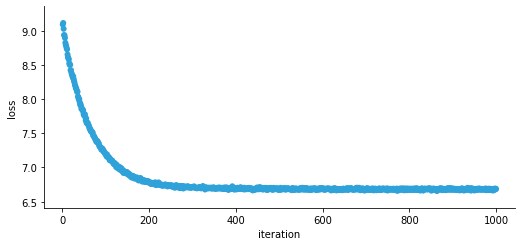

In [55]:
loss_plots[0]

:Scatter   [iteration]   (loss)
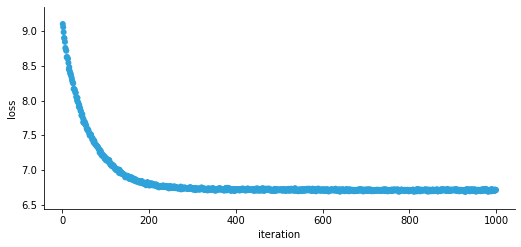

In [58]:
loss_plots[3]

In [47]:
p = pl.DataFrame(np.array(f(output[:-1])).T, ["iteration", "loss"]).plot.scatter(x = "iteration", y = "loss")

# Plot output from Beta Model

In [10]:
from pathlib import PosixPath
import plotnine as p9

In [15]:
#results = pd.read_csv(results_file, sep="\t")

In [ ]:
epsilon = 0.3
results_dir = PosixPath(f'/gpfs/commons/home/dmeyer/bindingQTL_share/{rbps[i]}/allelic')
results_file = results_dir / (f"{rbps[i]}_beta_10readsInput_filtered_epsilon0.3_ipreads30_allhet_struct.tsv.gz")
results = beta_model.fit_and_save(dat_sub, 
                                 results_file,
                                 use_structured_guide = True,
                                 iterations = 1000,
                                 device = device)

In [33]:
print("\n".join(rbps))

24a-hNIL-control-tdp
24a-hNIL-c9-tdp
24a-hNIP-control-tdp
24a-hNIP-c9-tdp


In [ ]:
this_rbp = rbps[3]
results_dir = PosixPath(f'/gpfs/commons/home/dmeyer/bindingQTL_share/{this_rbp}/allelic')
results_file = results_dir / (f"{this_rbp}_beta_filtered_epsilon0.3_ipreads30_allhet_struct.tsv.gz")
results = pd.read_csv(results_file, sep="\t")
print("\n".join(results.variantID[results.asb_q < .05]))

/tmp/ipykernel_20506/3282432280.py:14: FutureWarning: Using print(plot) to draw and show the plot figure is deprecated and will be removed in a future version. Use plot.show().


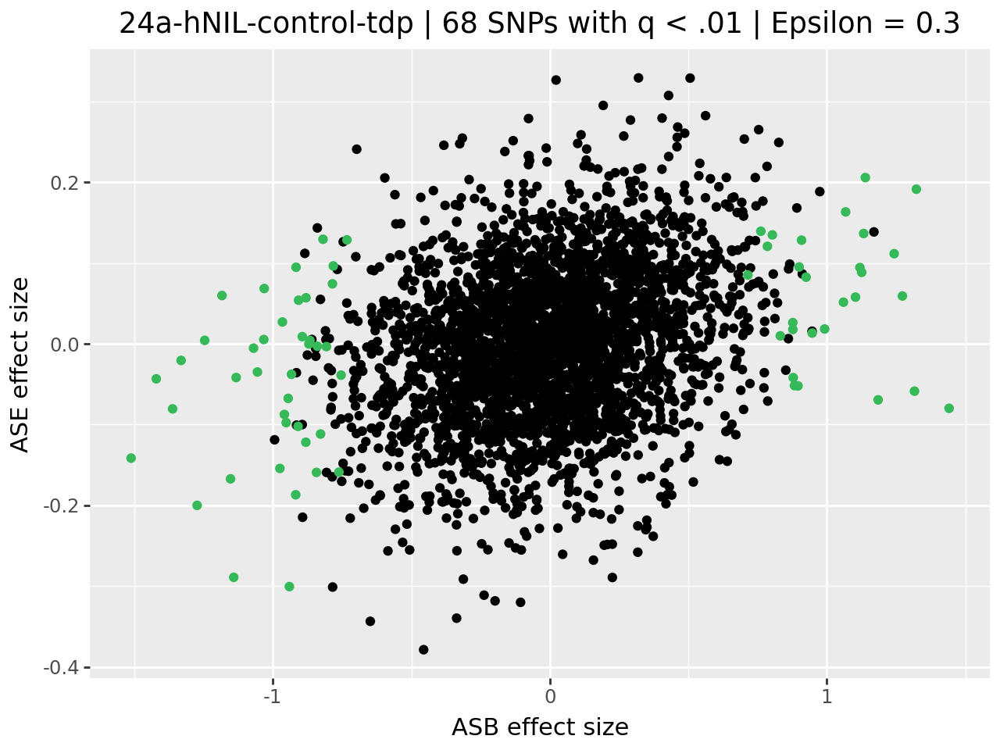

/tmp/ipykernel_20506/3282432280.py:14: FutureWarning: Using print(plot) to draw and show the plot figure is deprecated and will be removed in a future version. Use plot.show().


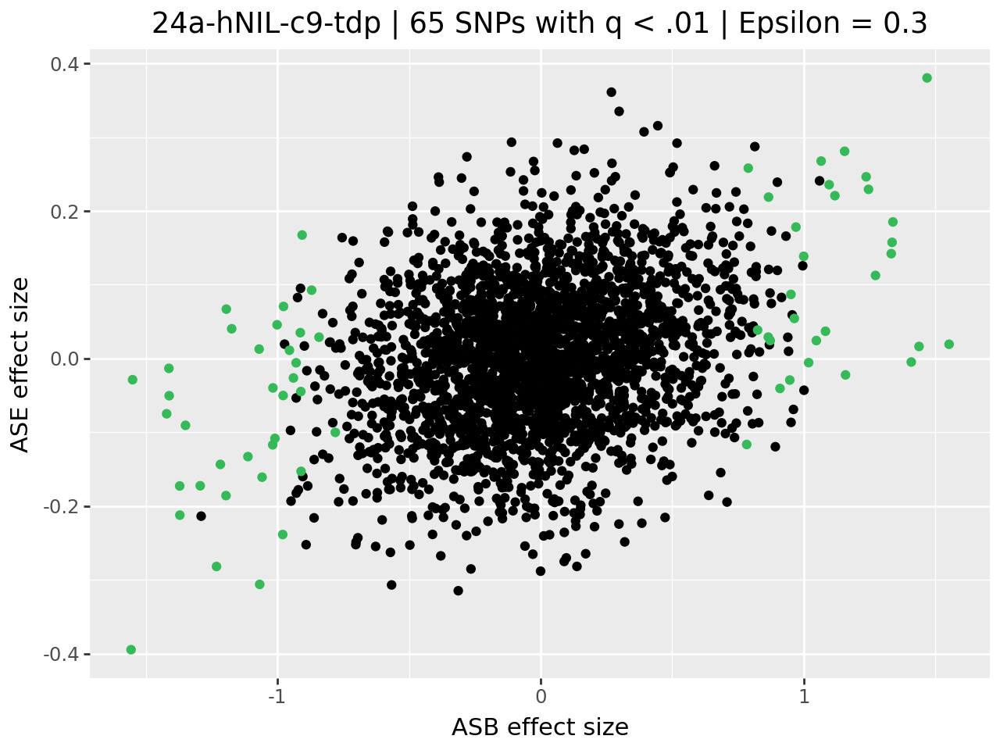

/tmp/ipykernel_20506/3282432280.py:14: FutureWarning: Using print(plot) to draw and show the plot figure is deprecated and will be removed in a future version. Use plot.show().


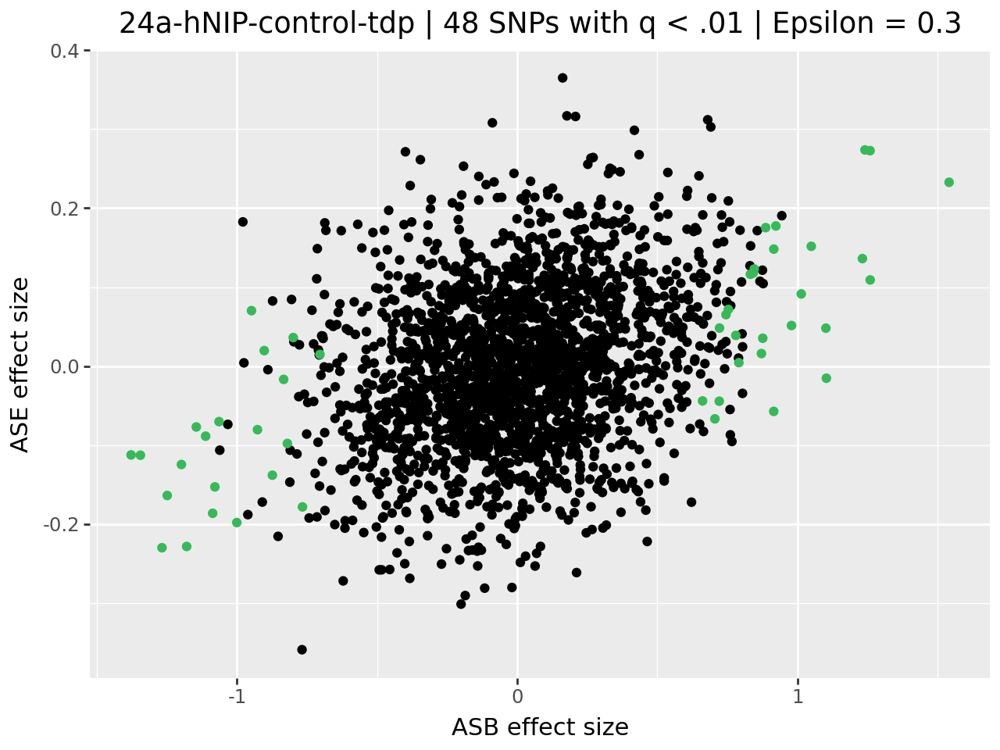

/tmp/ipykernel_20506/3282432280.py:14: FutureWarning: Using print(plot) to draw and show the plot figure is deprecated and will be removed in a future version. Use plot.show().


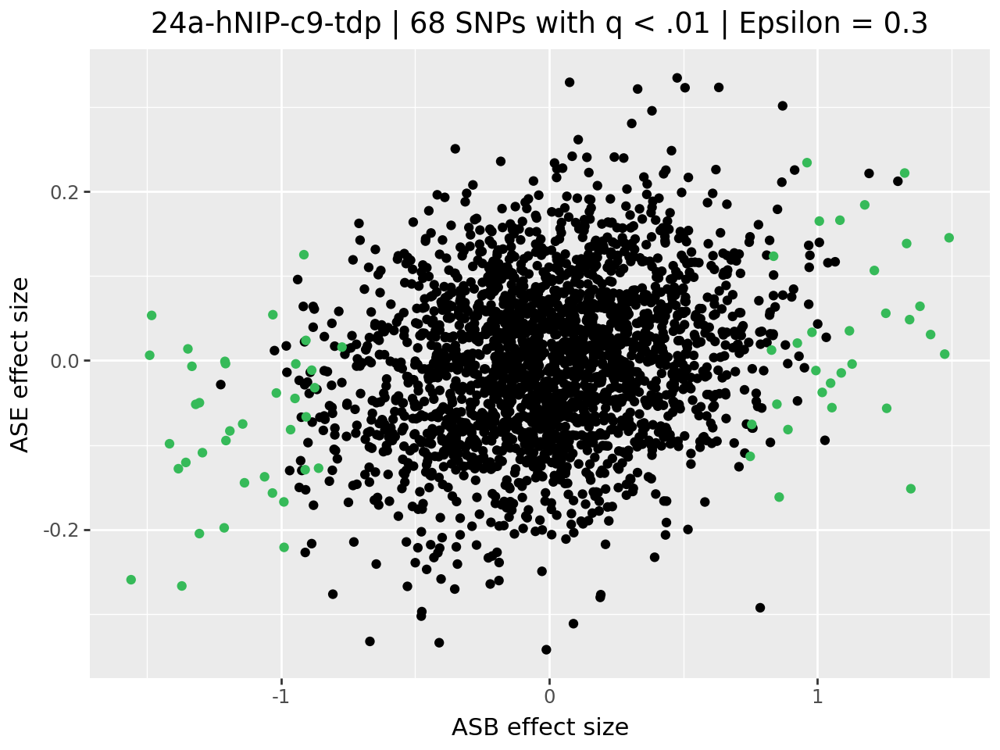

In [22]:
for i in range(len(rbps)):
    this_rbp = rbps[i]
    epsilon = 0.3
    qthresh = 0.01
    results_dir = PosixPath(f'/gpfs/commons/home/dmeyer/bindingQTL_share/{this_rbp}/allelic')
    results_file = results_dir / (f"{this_rbp}_beta_filtered_epsilon0.3_ipreads30_allhet_struct.tsv.gz")
    results = pd.read_csv(results_file, sep="\t")
    p = (p9.ggplot(results, p9.aes(x = "asb_loc", y = "ase_loc")) +
     p9.geom_point(data=results[results.asb_q >= qthresh])+
     p9.geom_point(data=results[results.asb_q < qthresh], color='#36ba59') +
     p9.labs(x = "ASB effect size", y = "ASE effect size", 
             title = f"{this_rbp} | {sum(results.asb_q < qthresh)} SNPs with q < .01 | Epsilon = {epsilon}")
    )
    print(p)

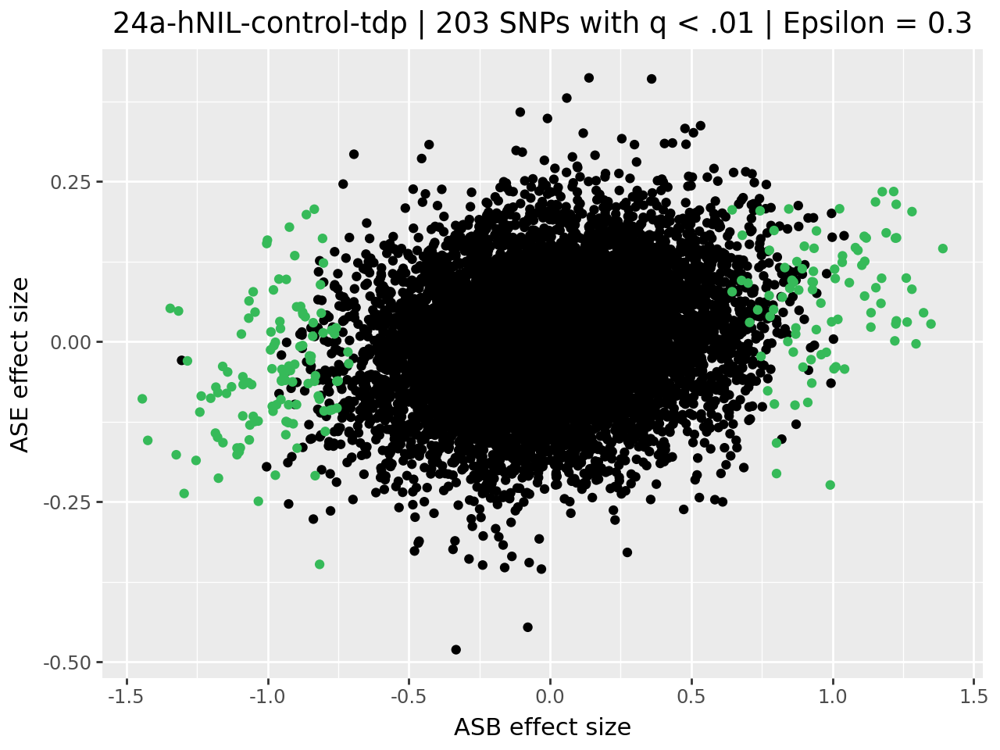

In [18]:
this_rbp = rbps[0]
epsilon = 0.3
qthresh = 0.01
results_dir = PosixPath(f'/gpfs/commons/home/dmeyer/bindingQTL_share/{this_rbp}/allelic')
results_file = results_dir / (f"{this_rbp}_beta_filtered_epsilon0.3_ipreads30_struct.tsv.gz")
results = pd.read_csv(results_file, sep="\t")
p = (p9.ggplot(results, p9.aes(x = "asb_loc", y = "ase_loc")) +
 p9.geom_point(data=results[results.asb_q >= qthresh])+
 p9.geom_point(data=results[results.asb_q < qthresh], color='#36ba59') +
 p9.labs(x = "ASB effect size", y = "ASE effect size", 
         title = f"{this_rbp} | {sum(results.asb_q < qthresh)} SNPs with q < .01 | Epsilon = {epsilon}")
)
p

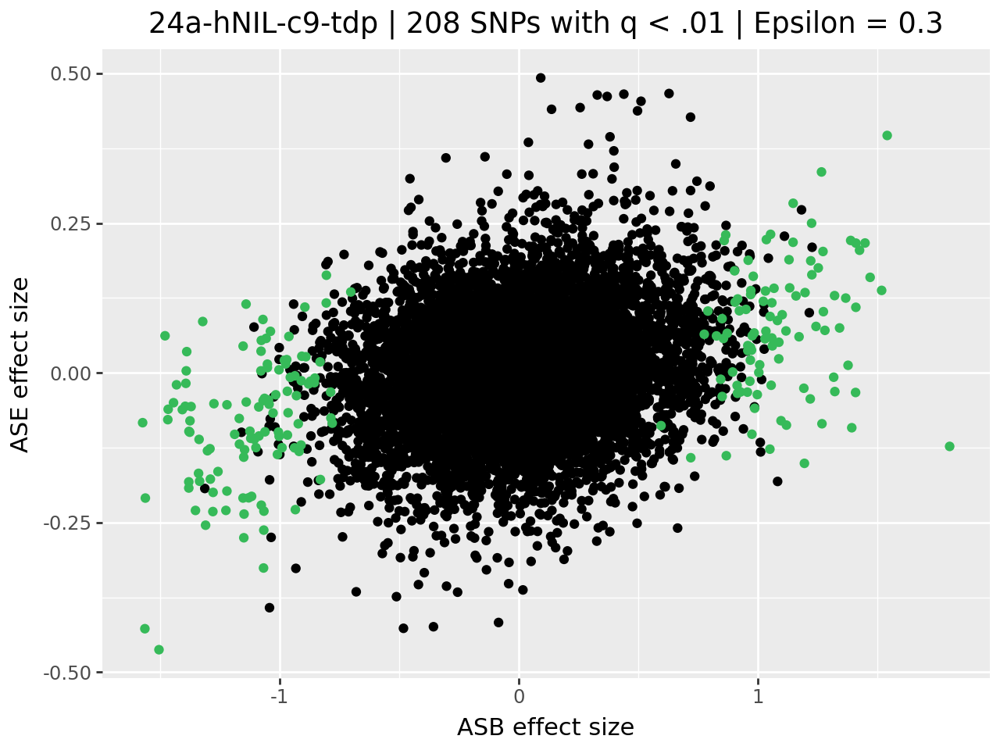

In [45]:
this_rbp = rbps[1]
epsilon = 0.3
qthresh = 0.01
results_dir = PosixPath(f'/gpfs/commons/home/dmeyer/bindingQTL_share/{this_rbp}/allelic')
results_file = results_dir / (f"{this_rbp}_beta_filtered_epsilon0.3_ipreads30_struct.tsv.gz")
results = pd.read_csv(results_file, sep="\t")
p = (p9.ggplot(results, p9.aes(x = "asb_loc", y = "ase_loc")) +
 p9.geom_point(data=results[results.asb_q >= qthresh])+
 p9.geom_point(data=results[results.asb_q < qthresh], color='#36ba59') +
 p9.labs(x = "ASB effect size", y = "ASE effect size", 
         title = f"{this_rbp} | {sum(results.asb_q < qthresh)} SNPs with q < .01 | Epsilon = {epsilon}")
)
p

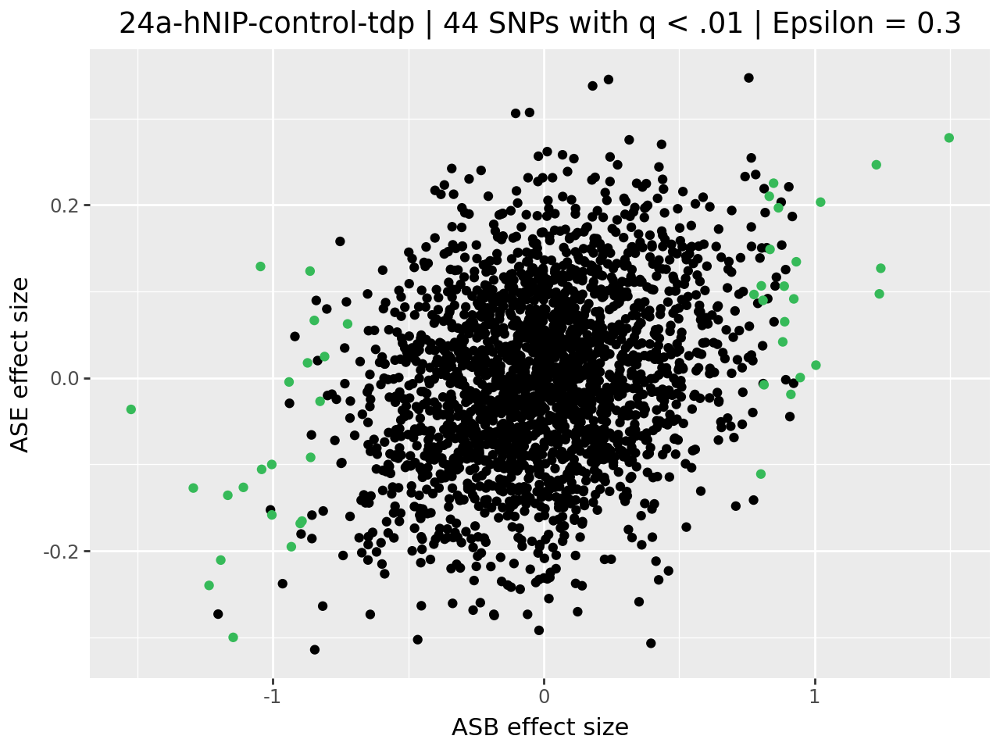

In [69]:
this_rbp = rbps[2]
epsilon = 0.3
qthresh = 0.01
results_dir = PosixPath(f'/gpfs/commons/home/dmeyer/bindingQTL_share/{this_rbp}/allelic')
results_file = results_dir / (f"{this_rbp}_beta_filtered_epsilon0.3_ipreads30_struct.tsv.gz")
results = pd.read_csv(results_file, sep="\t")
p = (p9.ggplot(results, p9.aes(x = "asb_loc", y = "ase_loc")) +
 p9.geom_point(data=results[results.asb_q >= qthresh])+
 p9.geom_point(data=results[results.asb_q < qthresh], color='#36ba59') +
 p9.labs(x = "ASB effect size", y = "ASE effect size", 
         title = f"{this_rbp} | {sum(results.asb_q < qthresh)} SNPs with q < .01 | Epsilon = {epsilon}")
)
p

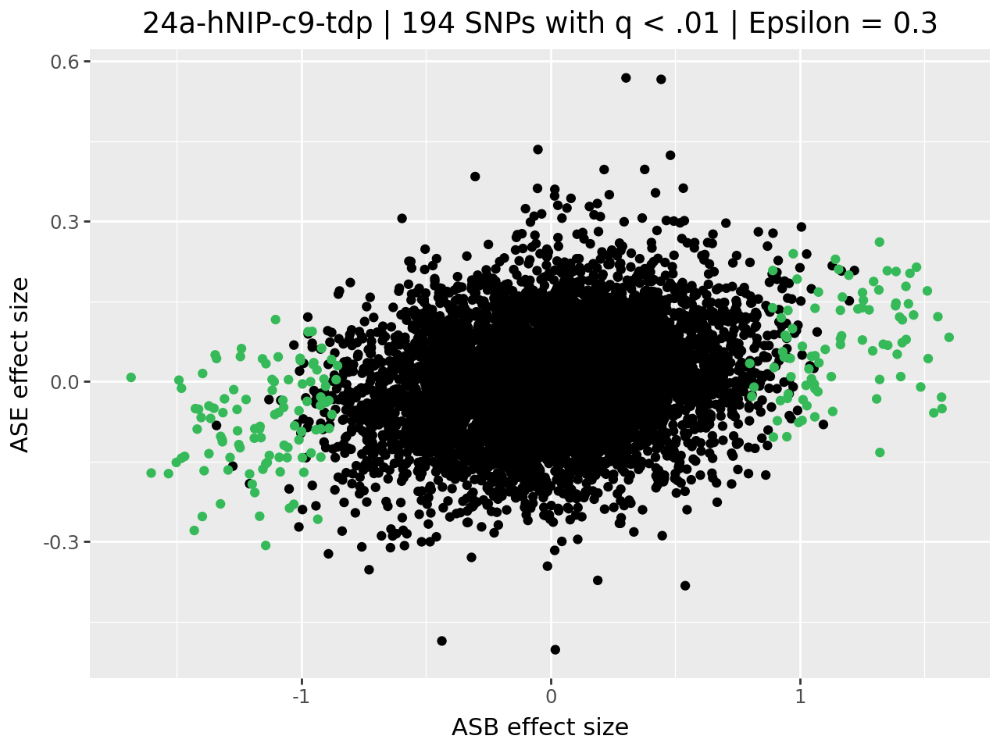

In [79]:
this_rbp = rbps[3]
epsilon = 0.3
qthresh = 0.01
results_dir = PosixPath(f'/gpfs/commons/home/dmeyer/bindingQTL_share/{this_rbp}/allelic')
results_file = results_dir / (f"{this_rbp}_beta_filtered_epsilon0.3_ipreads30_struct.tsv.gz")
results = pd.read_csv(results_file, sep="\t")
p = (p9.ggplot(results, p9.aes(x = "asb_loc", y = "ase_loc")) +
 p9.geom_point(data=results[results.asb_q >= qthresh])+
 p9.geom_point(data=results[results.asb_q < qthresh], color='#36ba59') +
 p9.labs(x = "ASB effect size", y = "ASE effect size", 
         title = f"{this_rbp} | {sum(results.asb_q < qthresh)} SNPs with q < .01 | Epsilon = {epsilon}")
)
p

In [ ]:
this_rbp = rbps[3]
qthresh = 0.05
results_dir = PosixPath(f'/gpfs/commons/home/dmeyer/bindingQTL_share/{this_rbp}/allelic')
results_file = results_dir / (f"{this_rbp}_beta_filtered_epsilon0.3_ipreads30_struct.tsv.gz")
results = pd.read_csv(results_file, sep="\t")
for x in results.variantID[results.asb_q < qthresh]:
    print(x)

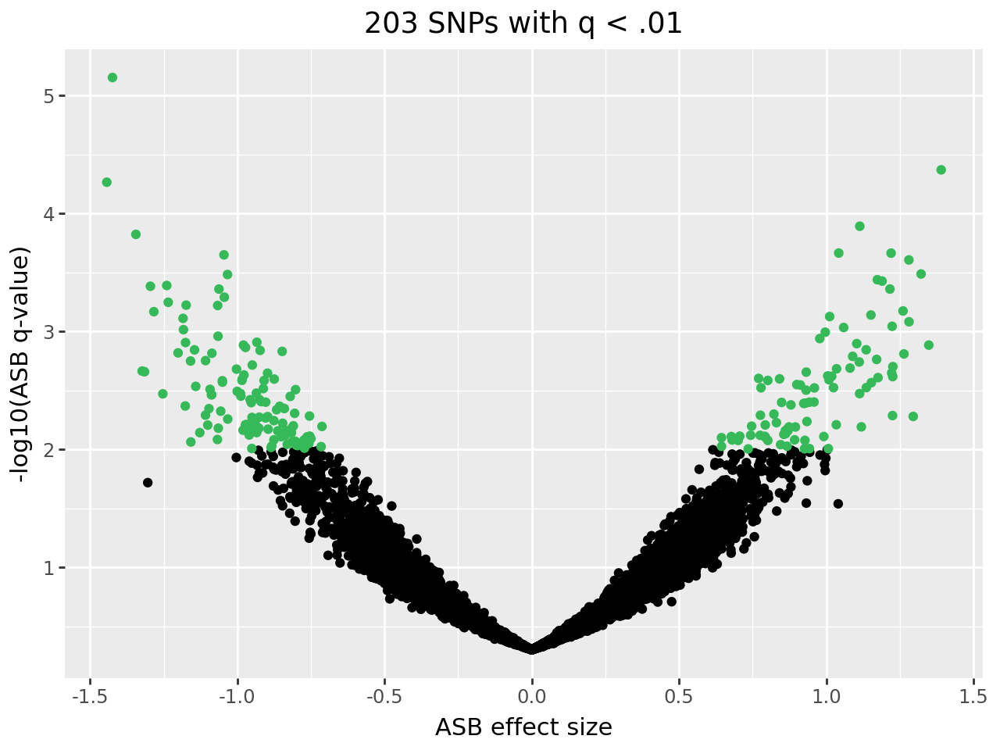

In [108]:
p = (p9.ggplot(results, p9.aes(x = "asb_loc", y = "-np.log10(asb_q)")) +
 p9.geom_point(data=results[results.asb_q >= 0.01])+
 p9.geom_point(data=results[results.asb_q < 0.01], color='#36ba59')+
    p9.labs(x = "ASB effect size", y = "-log10(ASB q-value)", title = f"{sum(results.asb_q < 0.01)} SNPs with q < .01")
)
p

In [19]:
results[(results.asb_q < .01) & (np.abs(results.asb_loc) > 1) & 
        (results.refCount_input > 4) &
        (results.altCount_input > 4) &
        (results.refCount_IP    > 4) &
        (results.altCount_IP    > 4)
       ][["variantID", "refAllele", "altAllele", "refCount_input", "altCount_input", "refCount_IP", "altCount_IP", "ase_loc", "ase_q", "asb_loc", "asb_q"]]

,variantID,refAllele,altAllele,refCount_input,altCount_input,refCount_IP,altCount_IP,ase_loc,ase_q,asb_loc,asb_q
1000,rs115374873,T,C,27,27,5,36,0.034571,0.418410,1.018866,0.002398
2657,rs1380813,G,A,59,52,72,8,-0.130395,0.153978,-1.062575,0.000437
3681,rs870287,T,G,21,17,205,8,-0.154392,0.114251,-1.424163,0.000007
5430,rs1185193,A,C,51,43,34,5,0.045865,0.375783,-1.044331,0.000512
5539,rs10796163,T,C,19,35,28,5,0.158229,0.128394,-1.000597,0.003219
6787,rs4772921,G,A,45,22,61,5,-0.213390,0.051756,-1.173990,0.000598
6810,rs330566,G,A,26,21,64,7,-0.067219,0.303003,-1.086571,0.001529
7184,rs3862138,C,T,33,27,6,46,-0.042664,0.389304,1.005207,0.002381
7410,rs3784634,C,T,30,45,51,6,0.036422,0.402000,-1.066852,0.000601
8248,rs12966029,G,A,19,38,42,5,0.152950,0.161539,-1.002966,0.002086


In [ ]:
results.in_peak

In [132]:
results[(results.asb_q < .01) & (np.abs(results.asb_loc) > 1) & 
        (results.in_peak == 1)
       ][["contig", "position", "variantID", "refAllele", "altAllele", "refCount_input", "altCount_input", "refCount_IP", "altCount_IP", "ase_loc", "ase_q", "asb_loc", "asb_q"]].rename(columns={"ase_loc": "ASE effect size", 
       "ase_q": "ASE q-value", "asb_loc": "ASB effect size", "asb_q": "ASB q-value"})

,contig,position,variantID,refAllele,altAllele,refCount_input,altCount_input,refCount_IP,altCount_IP,ASE effect size,ASE q-value,ASB effect size,ASB q-value
618,chr12,46436069,rs4768121,A,G,8,7,36,0,-0.381037,6.161804e-02,-1.405412,0.001967
966,chr13,93233936,rs4594115,A,T,15,6,8,66,-0.076130,3.771250e-01,1.030768,0.006443
1234,chr15,24974048,rs2554426,G,T,349,5,298,2,-1.906768,9.401624e-15,-1.446992,0.005151
1317,chr15,60434381,rs4774360,C,T,6,7,92,9,-0.206024,2.409710e-01,-1.005312,0.006573
2418,chr1,64082865,rs60795647,C,G,6,8,6,51,0.206043,2.256074e-01,1.083594,0.005776
2419,chr1,64082986,rs6668064,G,T,7,11,4,44,0.293901,1.178405e-01,1.065249,0.007650
2669,chr1,204100710,rs3795579,G,T,13,14,31,0,-0.250733,1.436236e-01,-1.242971,0.006672
4604,chr4,87926944,rs72657975,G,T,571,6,375,4,-2.089426,6.178014e-26,-1.374112,0.004673
4606,chr4,87927473,rs10002782,A,G,173,10,388,4,-1.410613,1.215197e-09,-1.546124,0.002907
4608,chr4,87931491,rs10005067,T,C,506,6,238,0,-2.076872,1.991957e-18,-2.106251,0.008537


rs10005067 is a risk allele for "Total body bone mineral density (age 30-45)" falls in a large intergenic region
rs28028 is in an intronic region of SEMA6A gene; no clear GWAS signal or clinical significance
rs6684 in exonic region of NDUFAF4 gene; no clear GWAS signal or clinical significance
rs17126159 ROR1 : Intron Variant with no reported clinical significance

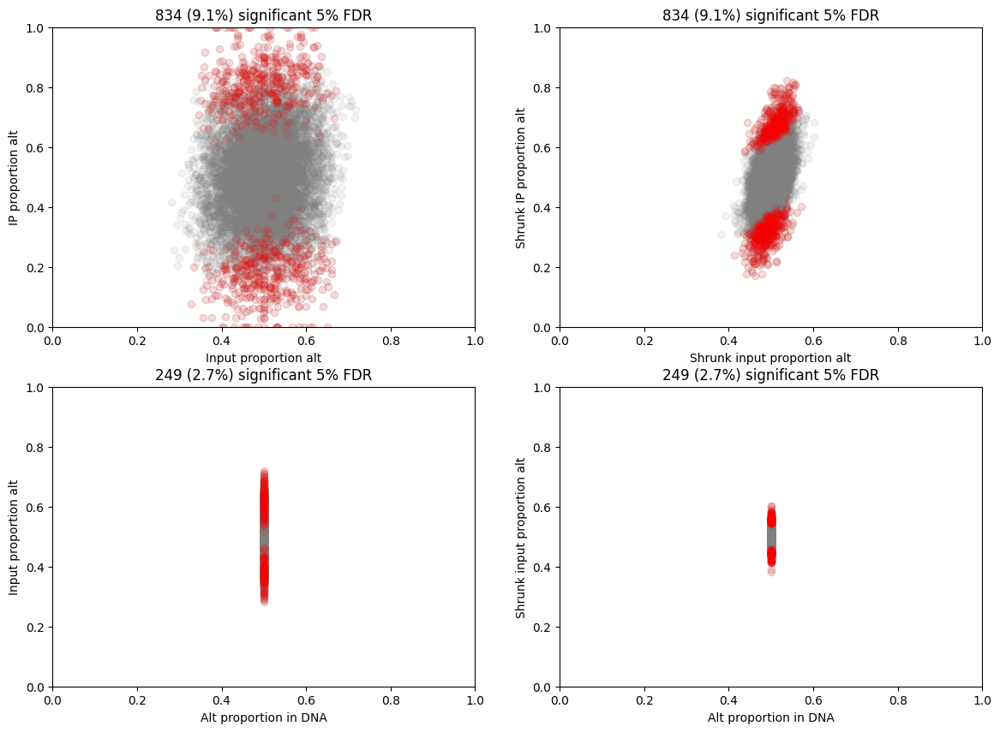

()

In [109]:
reload(beta_model)
beta_model.make_plots(results, fdr_threshold=0.05, sig_alpha=0.1)

For the beta model we model the two ratios (input and IP) separately but allow posterior dependence through the structured guide. For the Gaussian model we model the ASE effect (difference between DNA and RNA logit ratio) and ASB effect (difference between RNA and IP logit ratio). 

## Add in annotations

In [11]:
import pandas as pd
import polars as pl

In [39]:
from pooledQTL import interval_utils

exons = pd.read_csv("/gpfs/commons/home/dmeyer/bindingQTL_share/gencode.v38.exons.txt.gz", 
                   sep = "\t",  
                   index_col = False, usecols = range(3)).rename(columns = {"chr" : "chrom"})
exons = exons[(exons.end - exons.start) >= 9] # remove super short exons
exons_tree = interval_utils.to_interval_trees(exons, exons.chrom.unique())
gtf_file = "/gpfs/commons/home/dmeyer/bindingQTL_share/gencode.v38.annotation.gtf.gz"
#genc = pd.read_csv(gtf_file, sep = "\t",  index_col = False, header=None, comment="#", usecols = range(5))
#genc = genc.rename(columns={k:x for (k,x) in enumerate(["chrom", "gene", "annotation", "start", "end"])})
genc = pd.read_csv(gtf_file, sep='\t', comment='#', header=None, names=['chrom', 'gene', 'annotation', 'start', 'end', 'score', 'strand', 'frame', 'attributes'])

In [40]:
def get_gene_name(attributes):
        for attribute in attributes.split(';'):
            if 'gene_name' in attribute:
                return attribute.split('"')[1]
        return None

genc = genc[(genc.end - genc.start) >= 9] # remove super short annotations
genc.loc[:,"gene_name"] = genc["attributes"].apply(get_gene_name)

In [57]:
def f(x):
    return interval_utils.to_interval_trees(x, genc.chrom.unique())
gene_tree = f(genc[genc.annotation == "gene"][genc.columns[[0,3,4]]])
transcript_tree = f(genc[genc.annotation == "transcript"][genc.columns[[0,3,4]]])
utr_tree = f(genc[genc.annotation == "UTR"][genc.columns[[0,3,4]]])

def get_overlap_window(peaks, snps, window=100000): 
    return [min(len(peaks[row.chrom][row.position-window] | peaks[row.chrom][row.position] | peaks[row.chrom][row.position+window]), 1) for row in snps.itertuples() ]

In [93]:
int2gene = {}
for x in genc.itertuples():
    token = f'{x.chrom}:{x.start}-{x.end}'
    if token in int2gene.keys():
        int2gene[token] |= {x.gene_name}
    else:
        int2gene[token] = {x.gene_name}

In [112]:
def get_overlapping_genes(snps):
    if 'chrom' in snps.columns:
        pass
    elif 'contig' in snps.columns:
        snps = snps.rename(columns = {"contig": "chrom"})
    else:
        raise RuntimeError("No column for chromosome in snps dataframe")
    def gen():
        for row in snps.itertuples():
            intervals = gene_tree[ row.chrom ][ int(row.position) ]
            res = [int2gene[f'{row.chrom}:{i[0]}-{i[1]}'] for i in intervals]
            res = sorted(list(itertools.chain(*res)))
            yield ",".join(res)
    return pd.Series(gen())

In [115]:
def annotate_data(data, rbp):
    results_dir = PosixPath(f'/gpfs/commons/home/dmeyer/bindingQTL_share/{rbp}/allelic')
    #results_file = results_dir / (f"{rbp}_beta_10readsInput_filtered_epsilon0.3_ipreads30_allhet_struct.tsv.gz")
    #results = pd.read_csv(results_file, sep="\t")
    
    peaks_file_pos = f"/gpfs/commons/home/dmeyer/bindingQTL_share/{rbp}/peaks/{rbp}-pos_peaks.narrowPeak"
    peaks_file_neg = f"/gpfs/commons/home/dmeyer/bindingQTL_share/{rbp}/peaks/{rbp}-neg_peaks.narrowPeak"
    peaks_pos = pd.read_csv(peaks_file_pos, 
                        header = None,
                        names= ["chrom", "start", "end", "name", "score", "strand", "signalValue", "pValue", "qValue", "peak"],
                        sep = "\t",  
                        index_col = False)
    peaks_neg = pd.read_csv(peaks_file_neg, 
                        header = None,
                        names= ["chrom", "start", "end", "name", "score", "strand", "signalValue", "pValue", "qValue", "peak"],
                        sep = "\t",  
                        index_col = False)
    peak_tree_pos = interval_utils.to_interval_trees(peaks_pos, peaks_pos.chrom.unique())
    peak_tree_neg = interval_utils.to_interval_trees(peaks_neg, peaks_neg.chrom.unique())
    res = data.rename(columns={"contig": "chrom"})

    res["in_peak_pos"] = interval_utils.get_overlap(peak_tree_pos, res)
    res["in_peak_neg"] = interval_utils.get_overlap(peak_tree_neg, res)
    res["in_peak"] = res["in_peak_neg"] | res["in_peak_neg"]
    res["near_peak_100k"] = np.array(get_overlap_window(peak_tree_pos, res)) |  np.array(get_overlap_window(peak_tree_neg, res))
    res["near_peak_5k"] = np.array(get_overlap_window(peak_tree_pos, res, 5000)) |  np.array(get_overlap_window(peak_tree_neg, res, 5000))
    res["in_exon"] = interval_utils.get_overlap(exons_tree, res)
    res["in_transcript"] = interval_utils.get_overlap(transcript_tree, res)
    res["in_gene"] = interval_utils.get_overlap(gene_tree, res)
    res["in_utr"] = interval_utils.get_overlap(utr_tree, res)
    res["in_intron"] = (res["in_gene"] == 1) & (res["in_exon"] == 0)
    res["overlapping_genes"] = get_overlapping_genes(res)
    return res

In [53]:
for i in range(len(rbps)):
    rbp=rbps[i]
    results_dir = PosixPath(f'/gpfs/commons/home/dmeyer/bindingQTL_share/{rbp}/allelic')
    results_file = results_dir / (f"{rbp}_beta_10readsInput_filtered_epsilon0.3_ipreads30_allhet_struct.tsv.gz")
    results = pd.read_csv(results_file, sep="\t")
    annotate_data(results, rbp)
    results_file_annotated = results_dir / (f"{rbps[i]}_beta_10readsInput_filtered_epsilon0.3_ipreads30_allhet_struct_with_peaks.tsv.gz")
    results.rename(columns={"contig": "chrom"}).to_csv(results_file_annotated, sep="\t", index=False)

In [38]:
window = 100000
peak_tree_pos[row.chrom][row.position-window] | peak_tree_pos[row.chrom][row.position] | peak_tree_pos[row.chrom][row.position+window]

{Interval(7550073, 7554499)}

In [ ]:
#?min
#return [ min(len(peaks[row.chrom][row.position]),1) for row in snps.itertuples() ]

In [51]:
for i in range(len(rbps)):
    rbp=rbps[i]
    results_dir = PosixPath(f'/gpfs/commons/home/dmeyer/bindingQTL_share/{rbp}/allelic')
    results_file = results_dir / (f"{rbp}_beta_filtered_epsilon0.3_ipreads30_allhet_struct.tsv.gz")
    results = pd.read_csv(results_file, sep="\t")
    
    peaks_file_pos = f"/gpfs/commons/home/dmeyer/bindingQTL_share/{rbp}/peaks/{rbp}-pos_peaks.narrowPeak"
    peaks_file_neg = f"/gpfs/commons/home/dmeyer/bindingQTL_share/{rbp}/peaks/{rbp}-neg_peaks.narrowPeak"
    peaks_pos = pd.read_csv(peaks_file_pos, 
                        header = None,
                        names= ["chrom", "start", "end", "name", "score", "strand", "signalValue", "pValue", "qValue", "peak"],
                        sep = "\t",  
                        index_col = False)
    peaks_neg = pd.read_csv(peaks_file_neg, 
                        header = None,
                        names= ["chrom", "start", "end", "name", "score", "strand", "signalValue", "pValue", "qValue", "peak"],
                        sep = "\t",  
                        index_col = False)
    peak_tree_pos = interval_utils.to_interval_trees(peaks_pos, peaks_pos.chrom.unique())
    peak_tree_neg = interval_utils.to_interval_trees(peaks_neg, peaks_neg.chrom.unique())

    results["in_peak_pos"] = interval_utils.get_overlap(peak_tree_pos, results.rename(columns={"contig": "chrom"}))
    results["in_peak_neg"] = interval_utils.get_overlap(peak_tree_neg, results.rename(columns={"contig": "chrom"}))
    results["in_peak"] = results["in_peak_neg"] | results["in_peak_neg"]
    results["in_exon"] = interval_utils.get_overlap(exons_tree, results.rename(columns={"contig": "chrom"}))
    results["in_transcript"] = interval_utils.get_overlap(transcript_tree, results.rename(columns={"contig": "chrom"}))
    results["in_gene"] = interval_utils.get_overlap(gene_tree, results.rename(columns={"contig": "chrom"}))
    results["in_utr"] = interval_utils.get_overlap(utr_tree, results.rename(columns={"contig": "chrom"}))
    
    results_file_annotated = results_dir / (f"{rbps[i]}_beta_filtered_epsilon0.3_ipreads30_allhet_struct_with_peaks.tsv.gz")
    results.rename(columns={"contig": "chrom"}).to_csv(results_file_annotated, sep="\t", index=False)

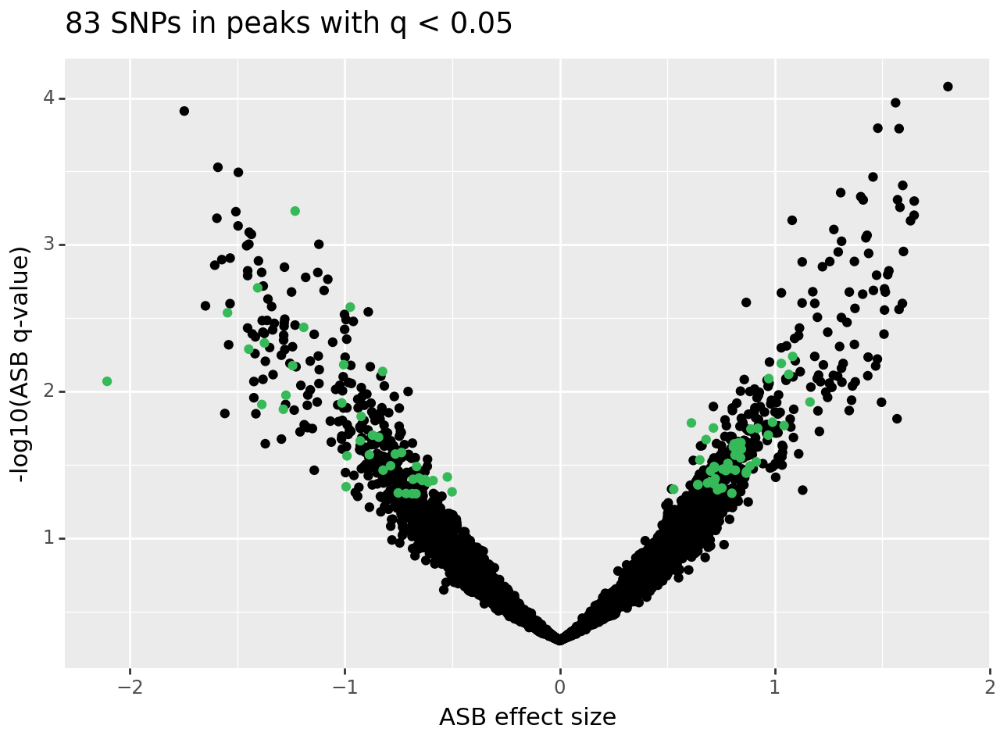

<Figure Size: (640 x 480)>

In [112]:
thresh=0.05
p = (p9.ggplot(results, p9.aes(x = "asb_loc", y = "-np.log10(asb_q)")) +
 p9.geom_point(data=results[(results.asb_q >= thresh)|(results.in_peak!=1)])+
 p9.geom_point(data=results[(results.asb_q < thresh)&(results.in_peak==1)], color='#36ba59')+
    p9.labs(x = "ASB effect size", y = "-log10(ASB q-value)", title = f"{sum((results.asb_q < thresh)&(results.in_peak==1))} SNPs in peaks with q < {thresh}")
)
p

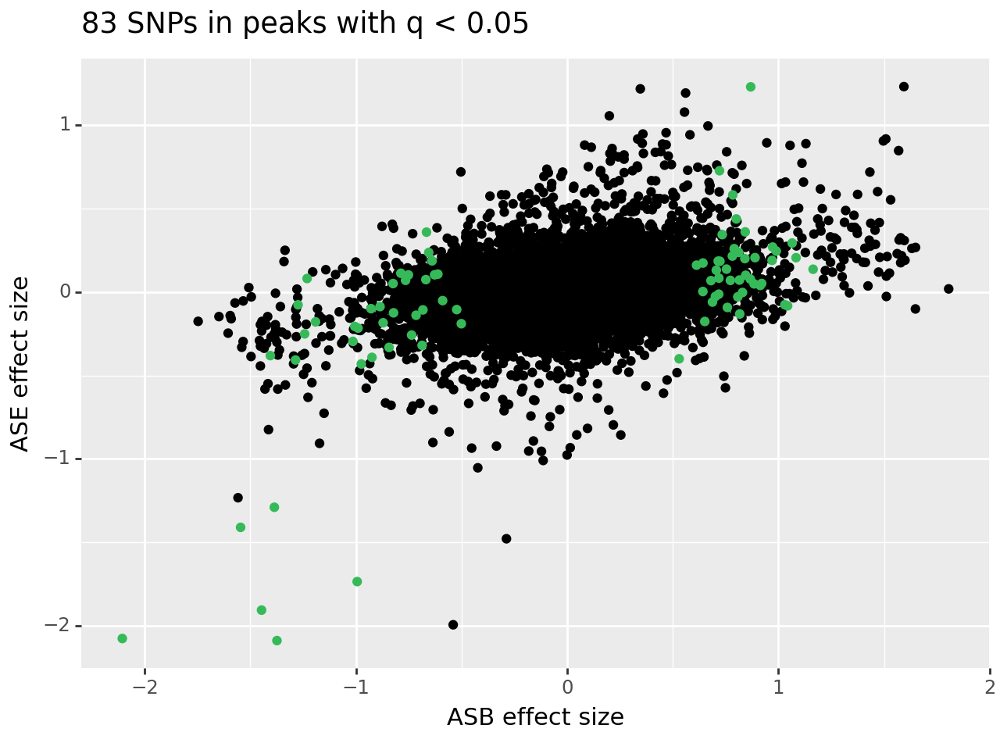

<Figure Size: (640 x 480)>

In [113]:
p = (p9.ggplot(results, p9.aes(x = "asb_loc", y = "ase_loc")) +
 p9.geom_point(data=results[(results.asb_q >= thresh)|(results.in_peak!=1)])+
 p9.geom_point(data=results[(results.asb_q < thresh)&(results.in_peak==1)], color='#36ba59')+
 p9.labs(x = "ASB effect size", y = "ASE effect size", title = f"{sum((results.asb_q < thresh)&(results.in_peak == 1))} SNPs in peaks with q < {thresh}")
)
p

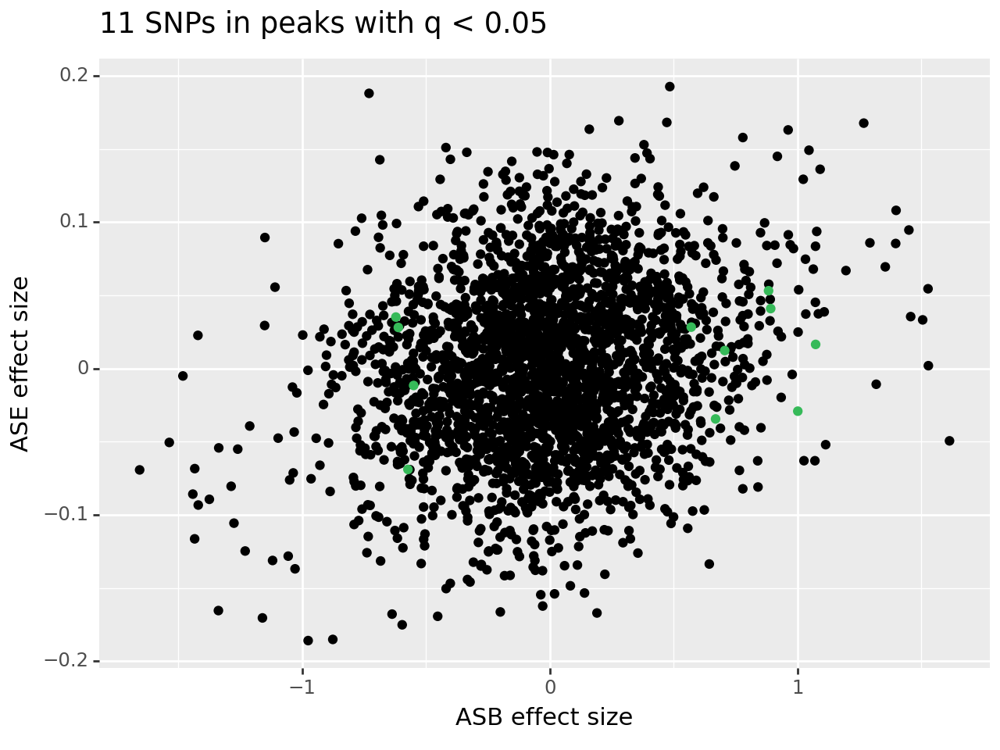

<Figure Size: (640 x 480)>

In [100]:
thresh=0.05
p = (p9.ggplot(results, p9.aes(x = "asb_loc", y = "ase_loc")) +
 p9.geom_point(data=results[(results.asb_q >= thresh)|(results.in_peak!=1)])+
 p9.geom_point(data=results[(results.asb_q < thresh)&(results.in_peak==1)], color='#36ba59')+
 p9.labs(x = "ASB effect size", y = "ASE effect size", title = f"{sum((results.asb_q < thresh)&(results.in_peak == 1))} SNPs in peaks with q < {thresh}")
)
p

In [102]:
print("\n".join(results.variantID[(results.asb_q < thresh)&(results.in_peak==1)]))

rs17801478
rs3203780
rs57094846
rs28773296
rs4539869
rs12715572
rs9862251
rs79563282
rs10473842
rs1052623
rs700082


In [134]:
results

,contig,position_hg19,variantID,refAllele,altAllele,position,refCount_input,altCount_input,totalCount_input,pred_ratio,...,shrunk_input_logratio,ase_loc,ase_sd,ase_q,shrunk_IP_logratio,asb_loc,asb_sd,asb_q,in_peak,in_exon
0,chr10,1040138,rs7070724,G,A,994198,8,8,16,0.5,...,0.009045,0.009045,0.242887,0.485147,-0.181023,-0.190068,0.457175,0.338798,0,0
1,chr10,1046712,rs2306409,G,A,1000772,51,74,125,0.5,...,0.136659,0.136659,0.200529,0.247780,-0.435006,-0.571664,0.424223,0.088901,0,1
2,chr10,1065191,rs17221491,A,G,1019251,4,10,14,0.5,...,0.145541,0.145541,0.320083,0.324664,0.228376,0.082835,0.447758,0.426614,0,1
3,chr10,1675548,rs12267329,A,G,1633353,5,6,11,0.5,...,0.171201,0.171201,0.249057,0.245916,0.689264,0.518062,0.441253,0.120183,1,0
4,chr10,1682481,rs10903520,G,A,1640286,6,10,16,0.5,...,-0.036610,-0.036610,0.232647,0.437479,-0.279682,-0.243072,0.439876,0.290272,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6784,chr9,139318071,rs7628,A,G,136423619,55,50,105,0.5,...,-0.180091,-0.180091,0.226761,0.213543,-0.209754,-0.029663,0.444518,0.473398,0,1
6785,chr9,139335599,rs1127152,A,G,136441147,37,19,56,0.5,...,-0.331026,-0.331026,0.213242,0.060290,-0.584175,-0.253149,0.471046,0.295489,0,1
6786,chr9,139371786,rs6560632,A,C,136477334,43,24,67,0.5,...,-0.328250,-0.328250,0.206881,0.056295,-0.575466,-0.247216,0.392782,0.264545,0,1
6787,chr9,139618283,rs6873,A,G,136723831,34,31,65,0.5,...,-0.084877,-0.084877,0.211950,0.344411,-0.901133,-0.816257,0.346087,0.009174,0,1


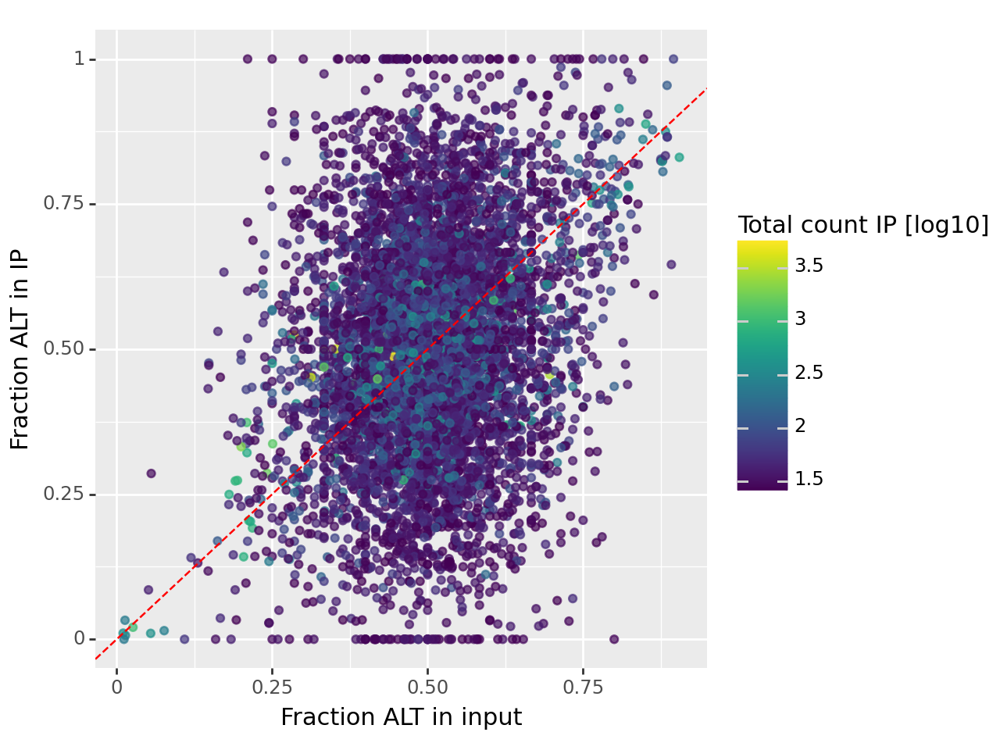

<Figure Size: (640 x 480)>

In [154]:
p = (p9.ggplot(results, p9.aes(x = "altCount_input/totalCount_input", y = "altCount_IP/totalCount_IP", color="np.log10(totalCount_IP)")) +
 p9.geom_point(data=results, alpha=0.7)+
# p9.geom_point(data=results[results.asb_q < 0.01], color='#36ba59')+
     p9.geom_abline(slope = 1, intercept = 0, color="red", linetype="dashed")+
     p9.labs(x = "Fraction ALT in input", y="Fraction ALT in IP", color="Total count IP [log10]")
 #p9.labs(x = "ASB effect size", y = "ASE effect size", title = f"{sum(results.asb_q < 0.01)} SNPs with q < .01")
)
p

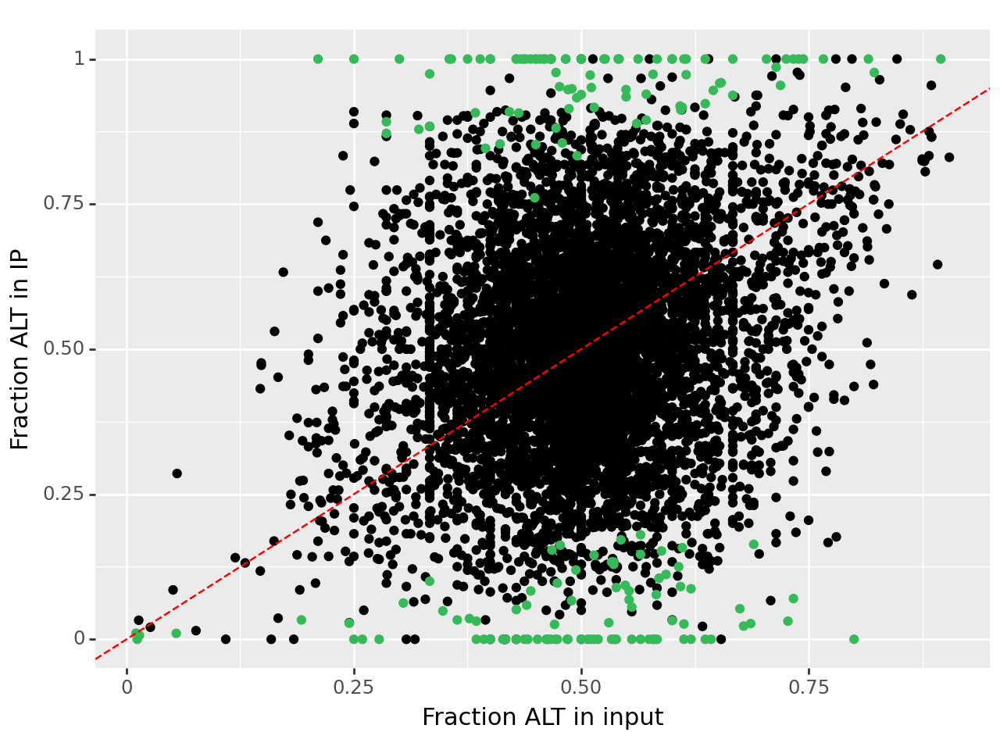

<Figure Size: (640 x 480)>

In [151]:
p = (p9.ggplot(results, p9.aes(x = "altCount_input/totalCount_input", y = "altCount_IP/totalCount_IP")) +
     p9.geom_point(data=results[results.asb_q >= 0.01])+
     p9.geom_point(data=results[results.asb_q < 0.01], color='#36ba59')+
     p9.geom_abline(slope = 1, intercept = 0, color="red", linetype="dashed")+
     p9.labs(x = "Fraction ALT in input", y="Fraction ALT in IP")
 #p9.labs(x = "ASB effect size", y = "ASE effect size", title = f"{sum(results.asb_q < 0.01)} SNPs with q < .01")
)
p

In [161]:
phased[phased.SNP == "rs12608932"]#[sample_ind]

,contig,position,SNP,refAllele,altAllele,GT,dosage1,dosage2
1050807,chr19,17752689,rs12608932,A,C,1|0,0.65,0.25


In [164]:
results[results.variantID == "rs12973192"]

,contig,position_hg19,variantID,refAllele,altAllele,position,refCount_input,altCount_input,totalCount_input,pred_ratio,...,shrunk_input_logratio,ase_loc,ase_sd,ase_q,shrunk_IP_logratio,asb_loc,asb_sd,asb_q,in_peak,in_exon


In [169]:
dat[dat.variantID == "rs12608932"]

,contig,position,variantID,refAllele,altAllele,refCount,altCount,totalCount


In [170]:
dat[dat.variantID == "rs12973192"]

,contig,position,variantID,refAllele,altAllele,refCount,altCount,totalCount


In [171]:
dat_IP[dat_IP.variantID == "rs12608932"]

,contig,position,variantID,refAllele,altAllele,refCount,altCount,totalCount
1481561,chr19,17641880,rs12608932,A,C,816,2,818


In [172]:
dat_IP[dat_IP.variantID == "rs12973192"]

,contig,position,variantID,refAllele,altAllele,refCount,altCount,totalCount
1481566,chr19,17642430,rs12973192,C,G,651,0,651


## 2024-01-26 request from David

How about we look at input SNPs and try to filter

```
mostly for Dan: Megan and i met yesterday. one idea we discussed is trying to filter for SNPs that we are confident show balance in the input, rather than trying to account for ASE in the ASB model. the question is how many SNPs we’d even get to test, especially in intronic regions where the input counts are low.
so, i think a good thing for you to try would be get a binomial confidence interval for the allelic proportion for each input SNP
i think you can do this with binomial.test
(actually i think the simulation code probably does that?)
we’d want that CI to be contained in [p-epsilon, p+epsilon] where p is the expected proportion (i.e. 0.5 in the single individual setting, whatever comes out of the deconvolution regression for the pooled setting)
you could vary epsilon in some range (maybe something like 0.1 would be a good starting point?) and see how many intronic and exonic SNP we would be able to test
probably easiest with a single individual first: i’m not sure quite how we should handle the situation where p is close to 0 or 1
```

In [241]:
x =  input_counts[0]

x["in_peak"] = interval_utils.get_overlap(peak_tree, x.rename(columns={"contig": "chrom"}))
x["in_exon"] = interval_utils.get_overlap(exons_tree, x.rename(columns={"contig": "chrom"}))
x["in_transcript"] = interval_utils.get_overlap(transcript_tree, x.rename(columns={"contig": "chrom"}))
x["in_gene"] = interval_utils.get_overlap(gene_tree, x.rename(columns={"contig": "chrom"}))
x["in_utr"] = interval_utils.get_overlap(utr_tree, x.rename(columns={"contig": "chrom"}))
x.to_csv("/home/dmeyer/projects/bqtls/tdp43/allelic/tdp43_input_annotated_allelic.out", index_label=False, sep="\t", index=False)

In [242]:
x = IP_counts[0]
x["in_peak"] = interval_utils.get_overlap(peak_tree, x.rename(columns={"contig": "chrom"}))
x["in_exon"] = interval_utils.get_overlap(exons_tree, x.rename(columns={"contig": "chrom"}))
x["in_transcript"] = interval_utils.get_overlap(transcript_tree, x.rename(columns={"contig": "chrom"}))
x["in_gene"] = interval_utils.get_overlap(gene_tree, x.rename(columns={"contig": "chrom"}))
x["in_utr"] = interval_utils.get_overlap(utr_tree, x.rename(columns={"contig": "chrom"}))
x.to_csv("/home/dmeyer/projects/bqtls/tdp43/allelic/tdp43_ip_annotated_allelic.out", index_label=False, sep="\t", index=False)

In [243]:
x

,contig,position,variantID,refAllele,altAllele,refCount,altCount,totalCount,in_peak,in_exon,in_transcript,in_gene,in_utr
0,chr1,128747,rs565117739,A,C,11,1,12,0,0,1,1,0
1,chr1,137978,rs529853750,G,A,124,0,124,0,0,0,0,0
2,chr1,139029,rs531551691,C,T,45,0,45,0,0,0,0,0
3,chr1,139030,rs751110858,G,A,45,0,45,0,0,0,0,0
4,chr1,139060,rs568513188,G,A,37,0,37,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1620755,chr22,50785210,rs138253809,C,T,22,0,22,0,1,1,1,0
1620756,chr22,50788205,.,A,T,11,0,11,0,0,1,1,0
1620757,chr22,50798982,.,G,A,26,0,26,0,1,1,1,0
1620758,chr22,50799058,.,G,C,31,0,31,0,1,1,1,0


In [92]:
dat_sub.shape

(6731, 16)

In [99]:
input_counts_filtered[3].shape

(13536, 8)

In [107]:
for i in range(len(rbps)):
    this_rbp = rbps[i]
    results_dir = PosixPath(f'/gpfs/commons/home/dmeyer/bindingQTL_share/{this_rbp}/allelic')
    results_file = results_dir / (f"{this_rbp}_beta_filtered_epsilon0.3_ipreads30_struct.tsv.gz")
    results = pd.read_csv(results_file, sep="\t")
    print(this_rbp, '\t', results.shape[0], 'variants tested')

24a-hNIL-control-tdp 	 9207 variants tested
24a-hNIL-c9-tdp 	 7733 variants tested
24a-hNIP-control-tdp 	 2259 variants tested
24a-hNIP-c9-tdp 	 6731 variants tested


In [ ]:
(9207, 22)
(7733, 22)
(2259, 22)
(6731, 22)

In [43]:
print('","'.join(map(str,input_files_filtered)))

/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-control-tdp/allelic/24a-hNIL-control-tdp_input_allelic.filtered_epsilon0.3_sharedhet.txt","/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-c9-tdp/allelic/24a-hNIL-c9-tdp_input_allelic.filtered_epsilon0.3_sharedhet.txt","/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-control-tdp/allelic/24a-hNIP-control-tdp_input_allelic.filtered_epsilon0.3_sharedhet.txt","/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-c9-tdp/allelic/24a-hNIP-c9-tdp_input_allelic.filtered_epsilon0.3_sharedhet.txt


# Look at deduplication effect

In [14]:
epsilon = 0.49
input_files = [f'/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-control-tdp/allelic/24a-hNIL-control-tdp_input_allelic.out',
               f'/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-c9-tdp/allelic/24a-hNIL-c9-tdp_input_allelic.out',
               f'/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-control-tdp/allelic/24a-hNIP-control-tdp_input_allelic.out',
               f'/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-c9-tdp/allelic/24a-hNIP-c9-tdp_input_allelic.out']
ip_files = [f'/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-control-tdp/allelic/24a-hNIL-control-tdp_ip_allelic.out',
            f'/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-c9-tdp/allelic/24a-hNIL-c9-tdp_ip_allelic.out',
            f'/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-control-tdp/allelic/24a-hNIP-control-tdp_ip_allelic.out',
            f'/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-c9-tdp/allelic/24a-hNIP-c9-tdp_ip_allelic.out']
filtered_input_files = [f"/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-control-tdp/allelic/24a-hNIL-control-tdp_input_allelic.10readsInput_filtered_epsilon{epsilon}_sharedhet.txt",
                        f"/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-c9-tdp/allelic/24a-hNIL-c9-tdp_input_allelic.10readsInput_filtered_epsilon{epsilon}_sharedhet.txt",
                        f"/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-control-tdp/allelic/24a-hNIP-control-tdp_input_allelic.10readsInput_filtered_epsilon{epsilon}_sharedhet.txt",
                        f"/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-c9-tdp/allelic/24a-hNIP-c9-tdp_input_allelic.10readsInput_filtered_epsilon{epsilon}_sharedhet.txt"]

# Deduped version
input_files_deduped = [f'/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-control-tdp/allelic/24a-hNIL-control-tdp_input_deduped_allelic.out',
    f'/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-c9-tdp/allelic/24a-hNIL-c9-tdp_input_deduped_allelic.out',
    f'/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-control-tdp/allelic/24a-hNIP-control-tdp_input_deduped_allelic.out',
    f'/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-c9-tdp/allelic/24a-hNIP-c9-tdp_input_deduped_allelic.out']
ip_files_deduped = [f'/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-control-tdp/allelic/24a-hNIL-control-tdp_ip_deduped_allelic.out',
               f'/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-c9-tdp/allelic/24a-hNIL-c9-tdp_ip_deduped_allelic.out',
               f'/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-control-tdp/allelic/24a-hNIP-control-tdp_ip_deduped_allelic.out',
               f'/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-c9-tdp/allelic/24a-hNIP-c9-tdp_ip_deduped_allelic.out']
filtered_input_files_deduped = [f"/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-control-tdp/allelic/24a-hNIL-control-tdp_input_deduped_allelic.10readsInput_filtered_epsilon{epsilon}_sharedhet.txt",
                          f"/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-c9-tdp/allelic/24a-hNIL-c9-tdp_input_deduped_allelic.10readsInput_filtered_epsilon{epsilon}_sharedhet.txt",
                          f"/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-control-tdp/allelic/24a-hNIP-control-tdp_input_deduped_allelic.10readsInput_filtered_epsilon{epsilon}_sharedhet.txt",
                          f"/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-c9-tdp/allelic/24a-hNIP-c9-tdp_input_deduped_allelic.10readsInput_filtered_epsilon{epsilon}_sharedhet.txt"]

donors = ['CTRL-NEUHE723FGT-02545-G', 'CASE-NEUFV237VCZ-01369-G', 'CTRL-NEUHE723FGT-02545-G', 'CASE-NEUFV237VCZ-01369-G']
rbps = ["24a-hNIL-control-tdp", "24a-hNIL-c9-tdp", "24a-hNIP-control-tdp", "24a-hNIP-c9-tdp"]

In [15]:
import polars as pl
import pandas as pd
import plotnine as p9
from pathlib import PosixPath

In [18]:
import importlib
#import poolqtl
#importlib.reload(poolqtl.interval_utils)

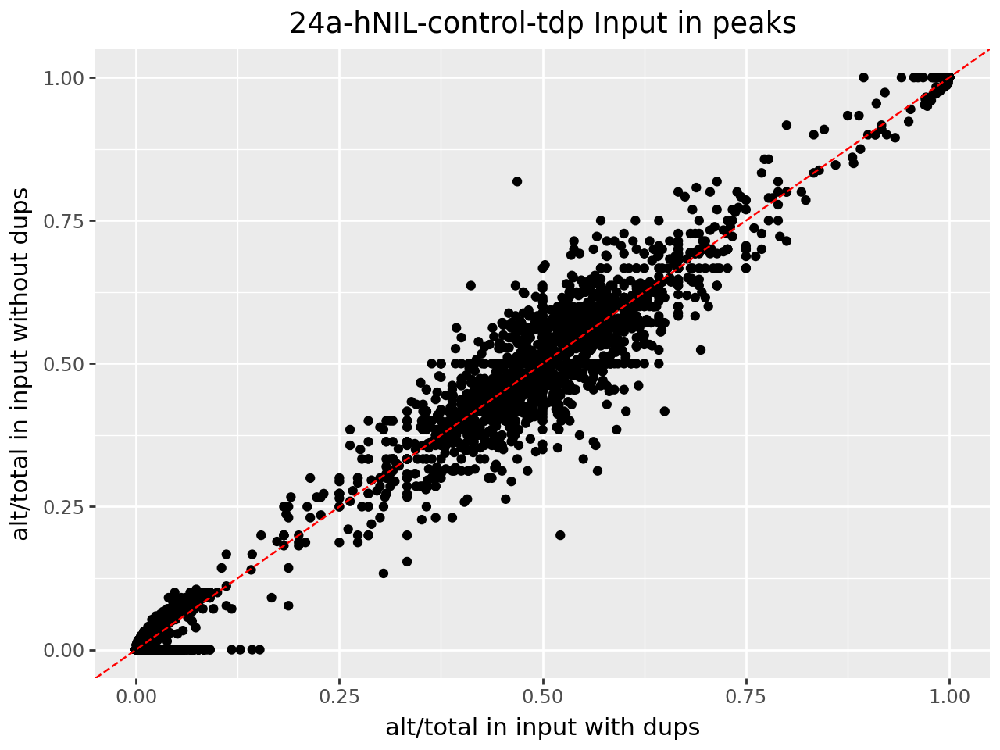

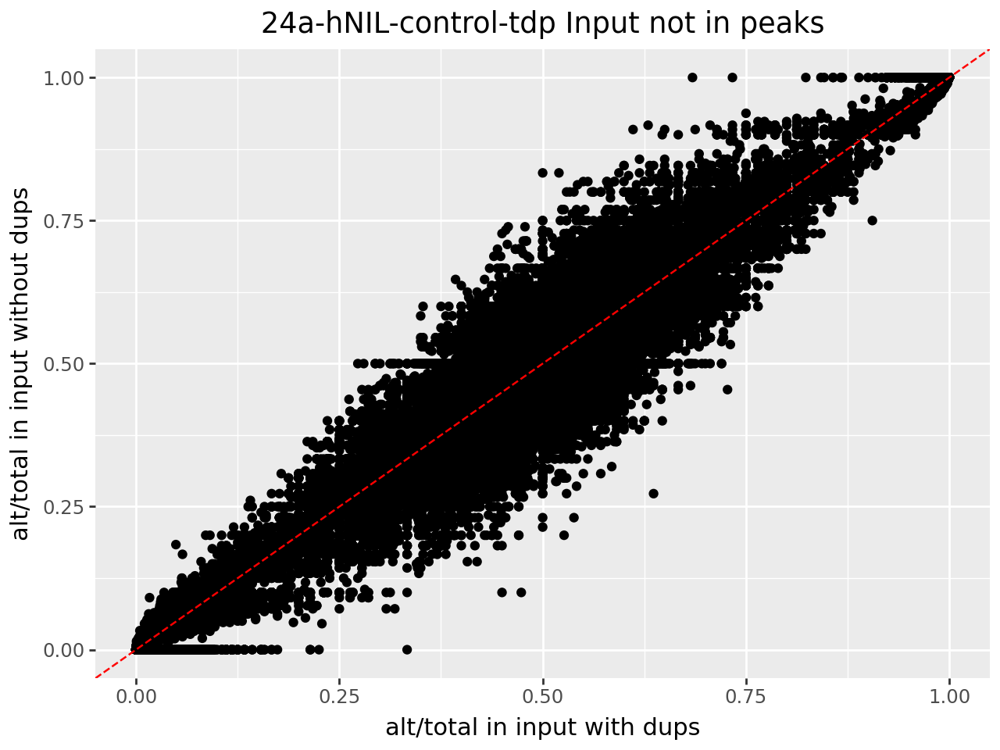

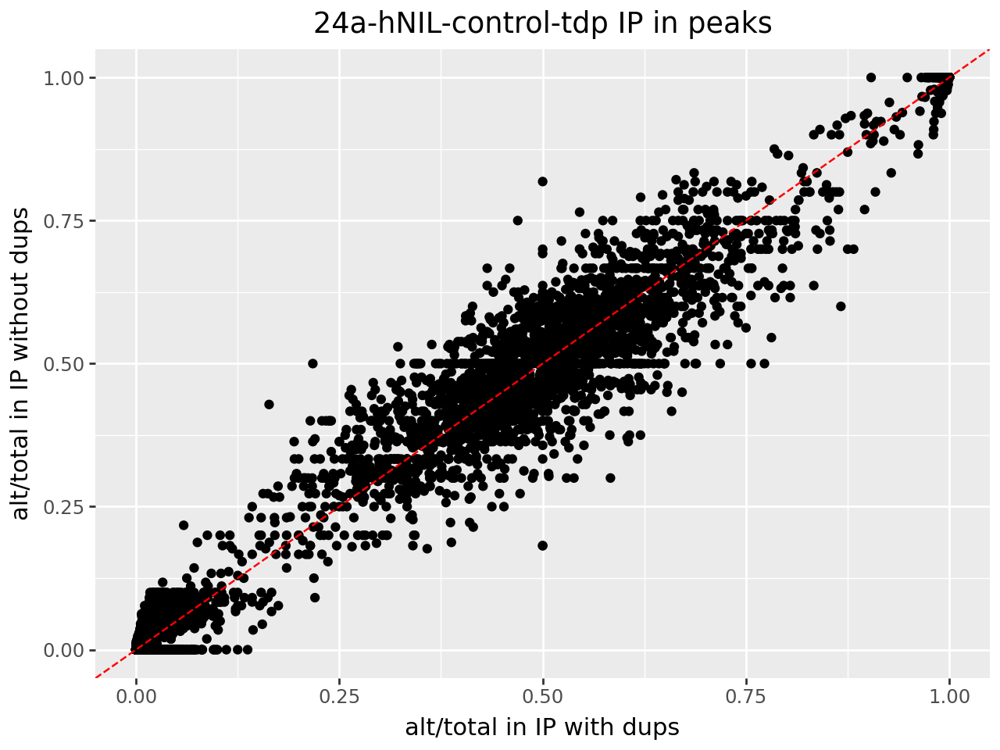

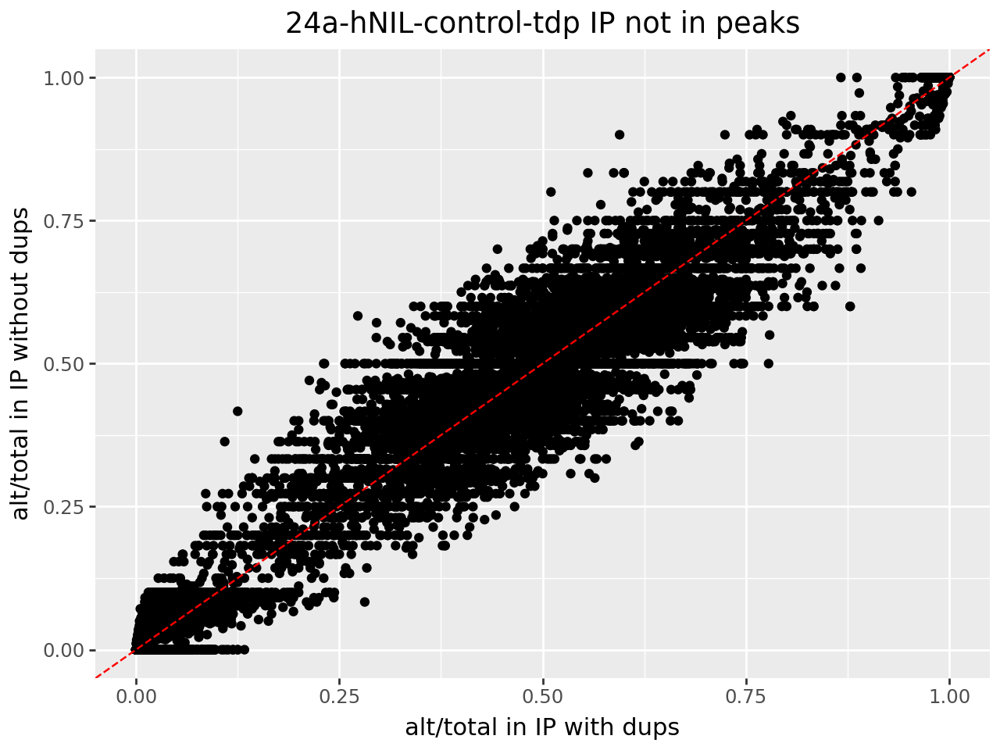

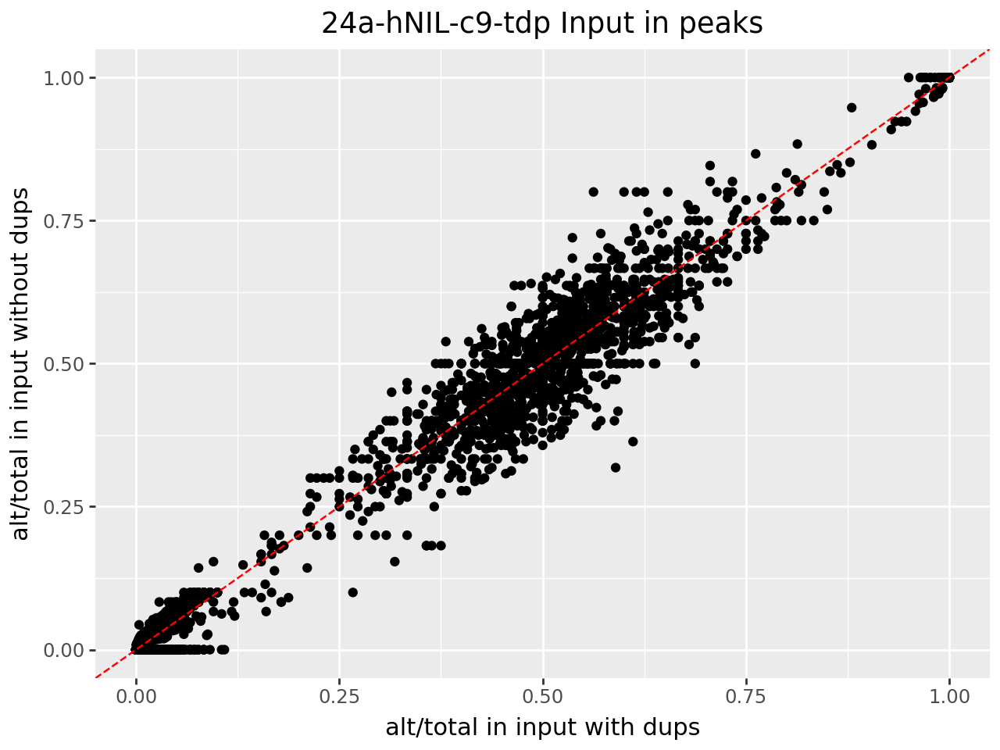

...

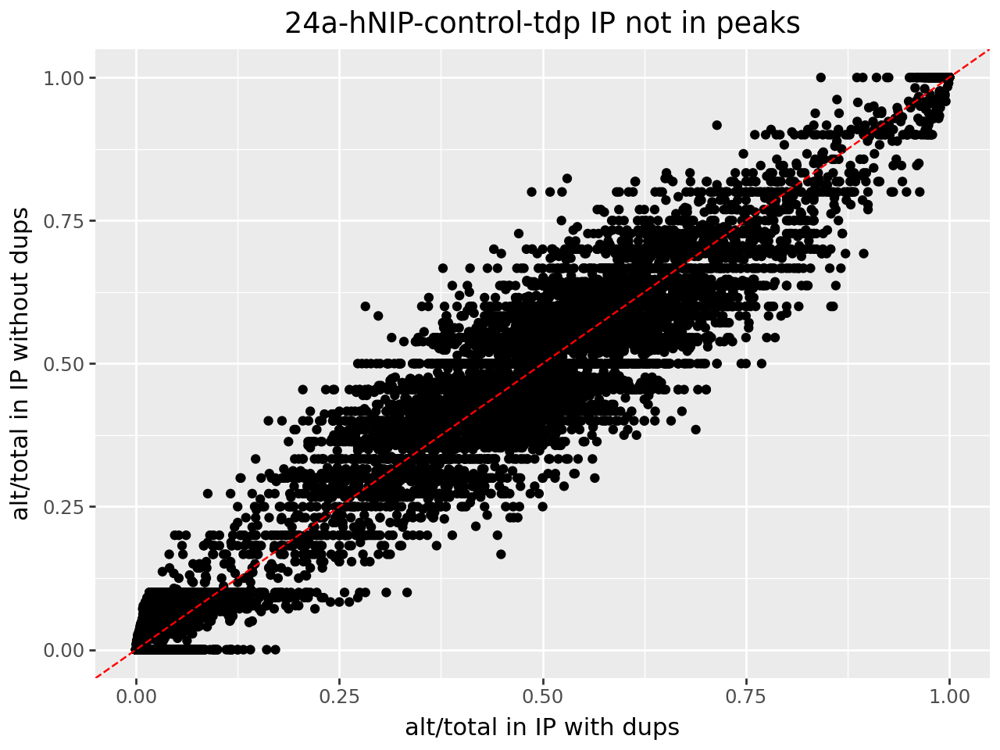

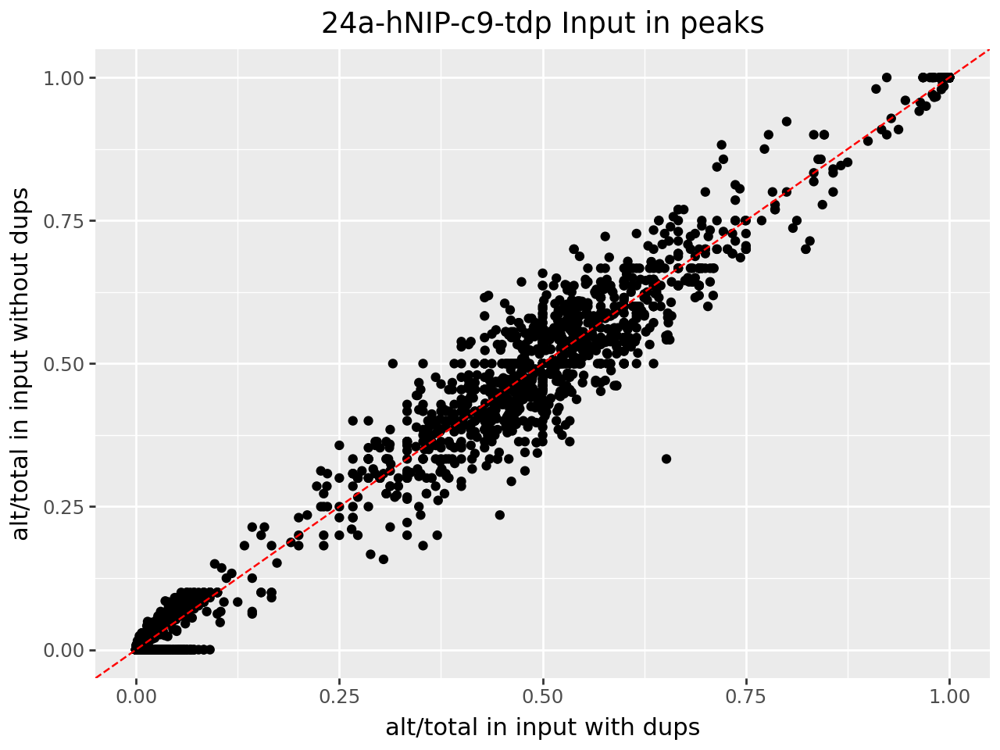

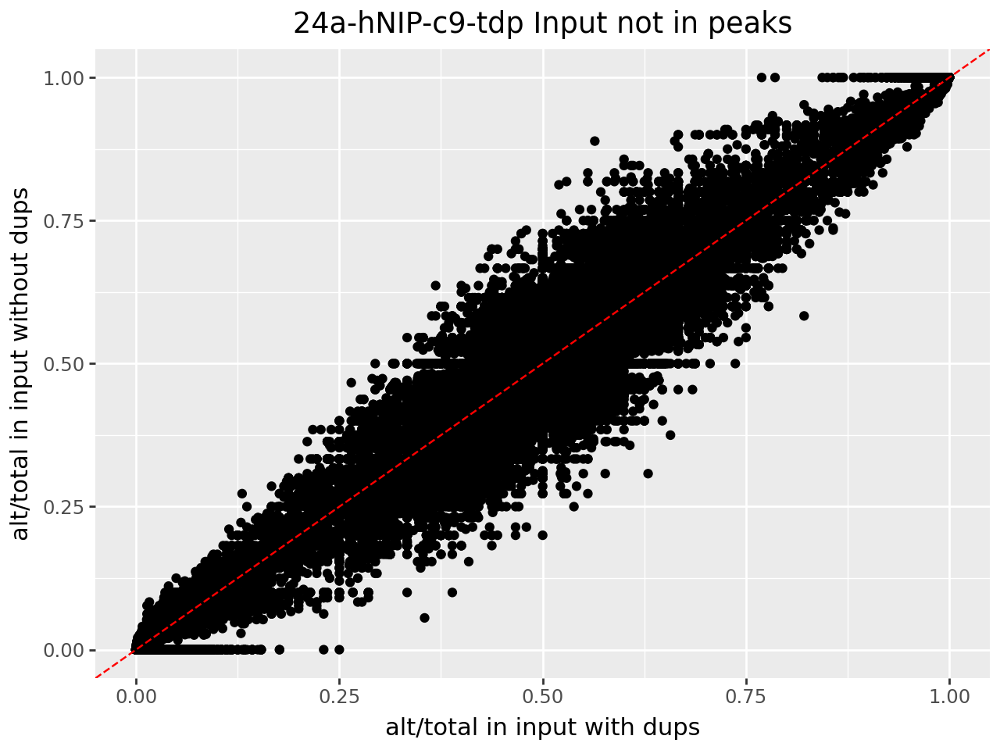

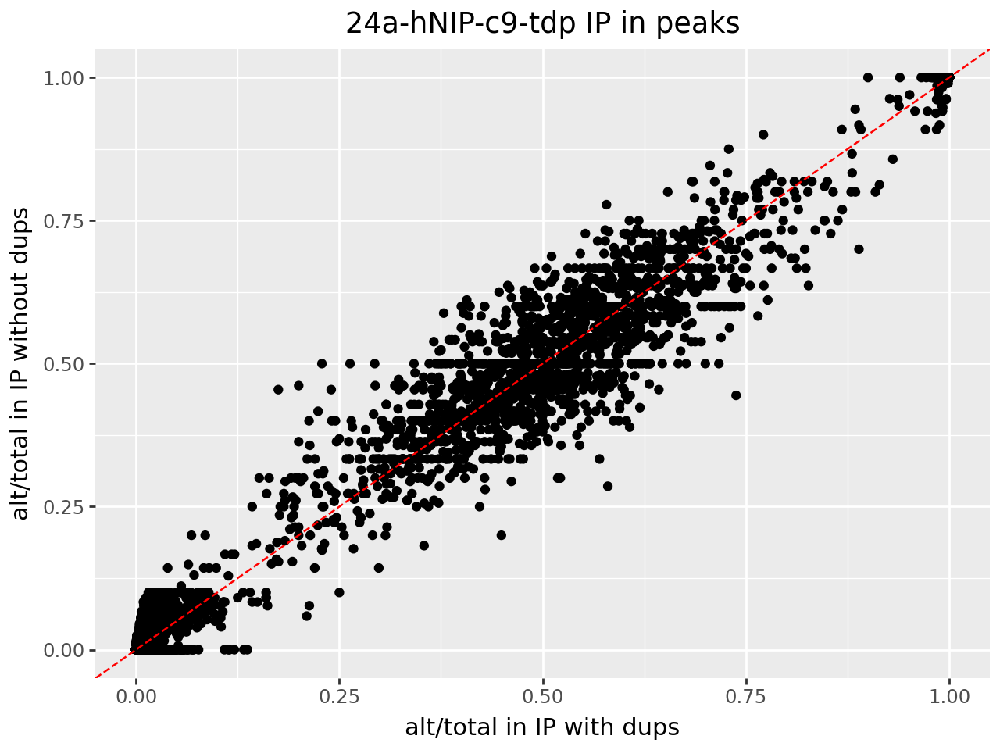

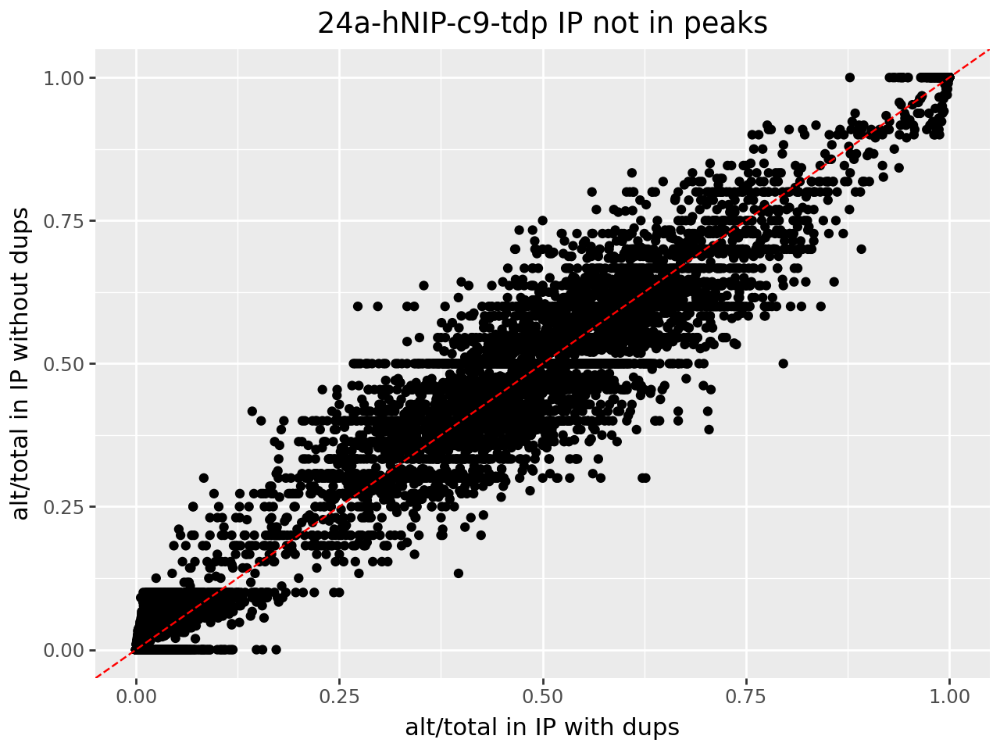

In [65]:
for i in range(4):
    x = pl.read_csv(input_files[i],separator="\t", truncate_ragged_lines=True)
    y = pl.read_csv(input_files_deduped[i],separator ="\t", truncate_ragged_lines=True)
    joint = x.join(y, on=["contig", "position", "variantID", "refAllele", "altAllele"], how='inner')
    joint = annotate_data(joint.to_pandas(), rbps[i])
    
    p1 = (p9.ggplot(joint[joint["in_peak"] == 1], p9.aes(x="altCount / totalCount", y = "altCount_right / totalCount_right")) +
         p9.geom_point() +  # Color points by density
     p9.geom_abline(slope = 1, intercept = 0, color="red", linetype="dashed") +
     p9.labs(x = "alt/total in input with dups", y = "alt/total in input without dups", title=f"{rbps[i]} Input in peaks")
    )
    p2 = (p9.ggplot(joint[joint["in_peak"] == 0], p9.aes(x="altCount / totalCount", y = "altCount_right / totalCount_right")) +
         p9.geom_point() +  # Color points by density
     p9.geom_abline(slope = 1, intercept = 0, color="red", linetype="dashed") +
     p9.labs(x = "alt/total in input with dups", y = "alt/total in input without dups", title=f"{rbps[i]} Input not in peaks")
    )
    p1.show()
    p2.show()
    
    x = pl.read_csv(ip_files[i],separator="\t", truncate_ragged_lines=True)
    y = pl.read_csv(ip_files_deduped[i],separator ="\t", truncate_ragged_lines=True)
    joint = x.join(y, on=["contig", "position", "variantID", "refAllele", "altAllele"], how='inner')
    joint = annotate_data(joint.to_pandas(), rbps[i])
    
    p3 = (p9.ggplot(joint[joint["in_peak"] == 1], p9.aes(x="altCount / totalCount", y = "altCount_right / totalCount_right")) +
         p9.geom_point() +  # Color points by density
     p9.geom_abline(slope = 1, intercept = 0, color="red", linetype="dashed") +
     p9.labs(x = "alt/total in IP with dups", y = "alt/total in IP without dups", title=f"{rbps[i]} IP in peaks")
    )
    p4 = (p9.ggplot(joint[joint["in_peak"] == 0], p9.aes(x="altCount / totalCount", y = "altCount_right / totalCount_right")) +
         p9.geom_point() +  # Color points by density
     p9.geom_abline(slope = 1, intercept = 0, color="red", linetype="dashed") +
     p9.labs(x = "alt/total in IP with dups", y = "alt/total in IP without dups", title=f"{rbps[i]} IP not in peaks")
    )
    p3.show()
    p4.show()
    break

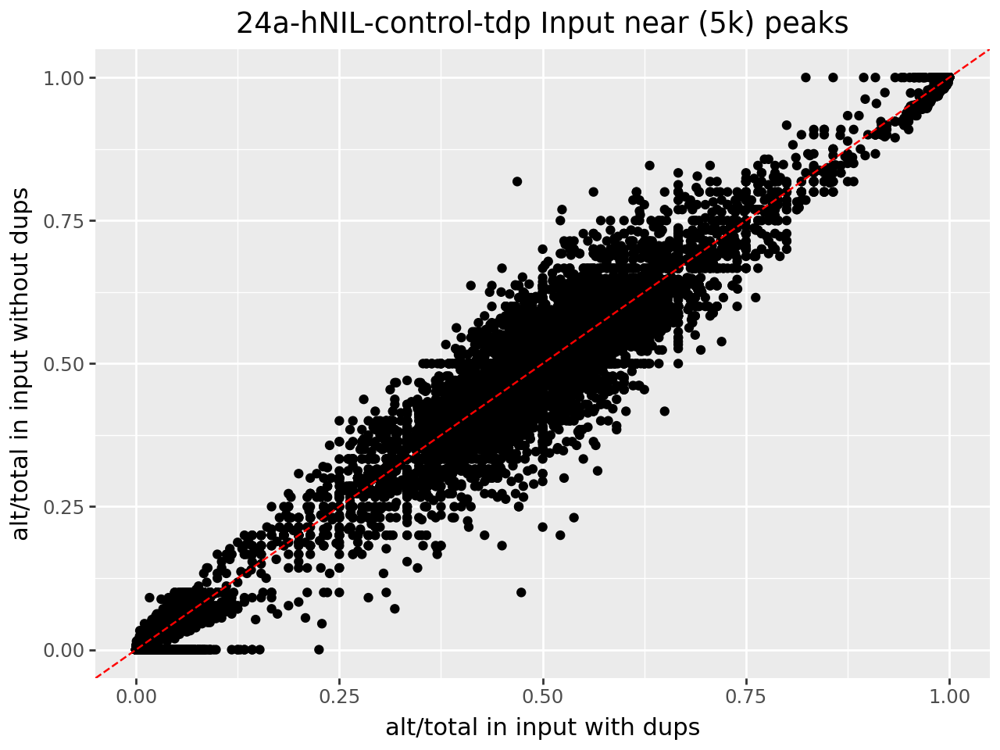

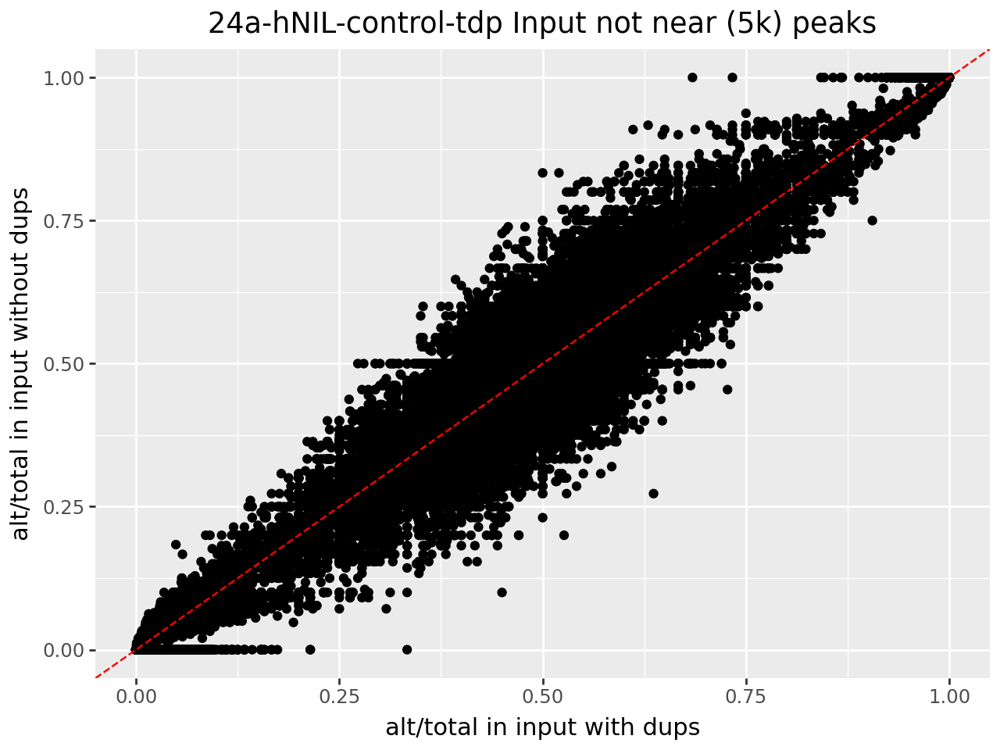

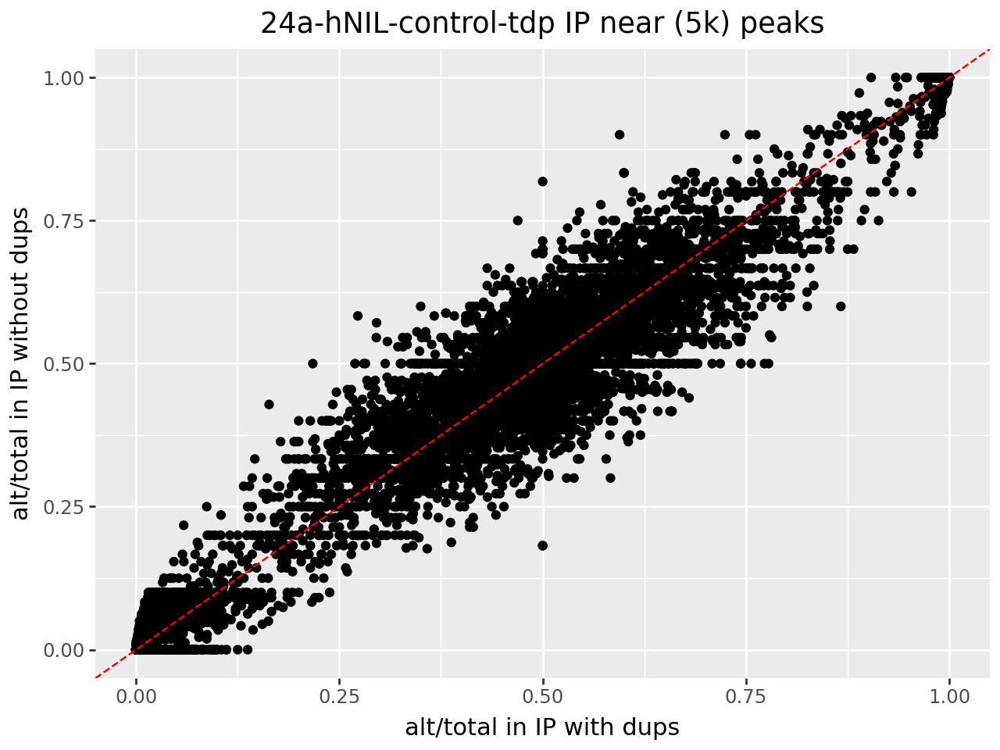

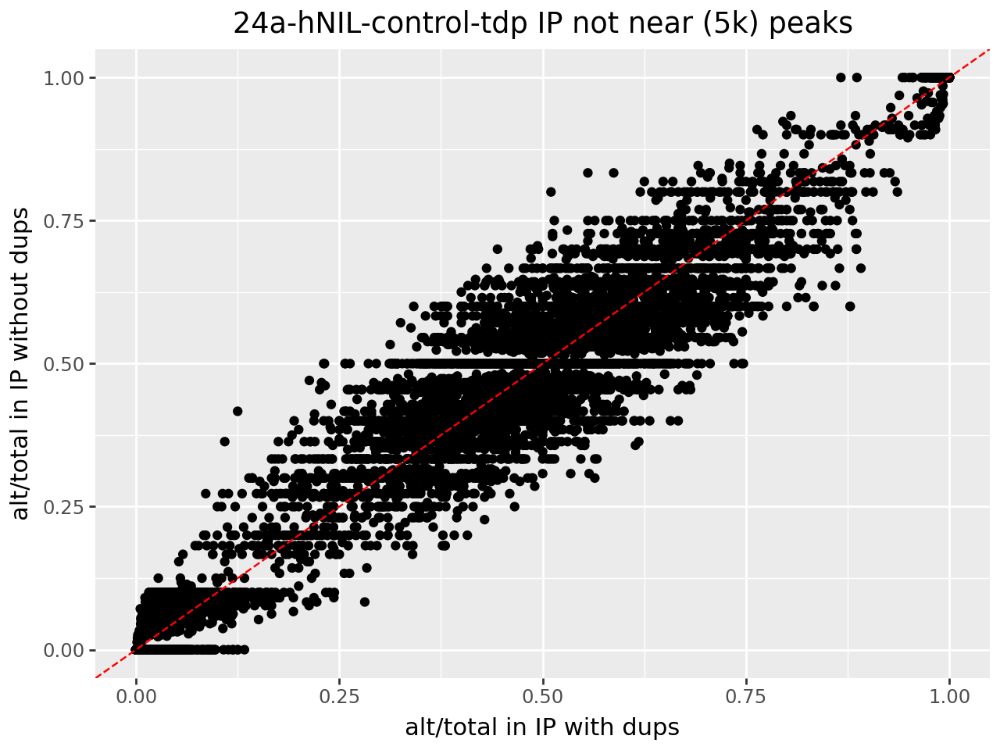

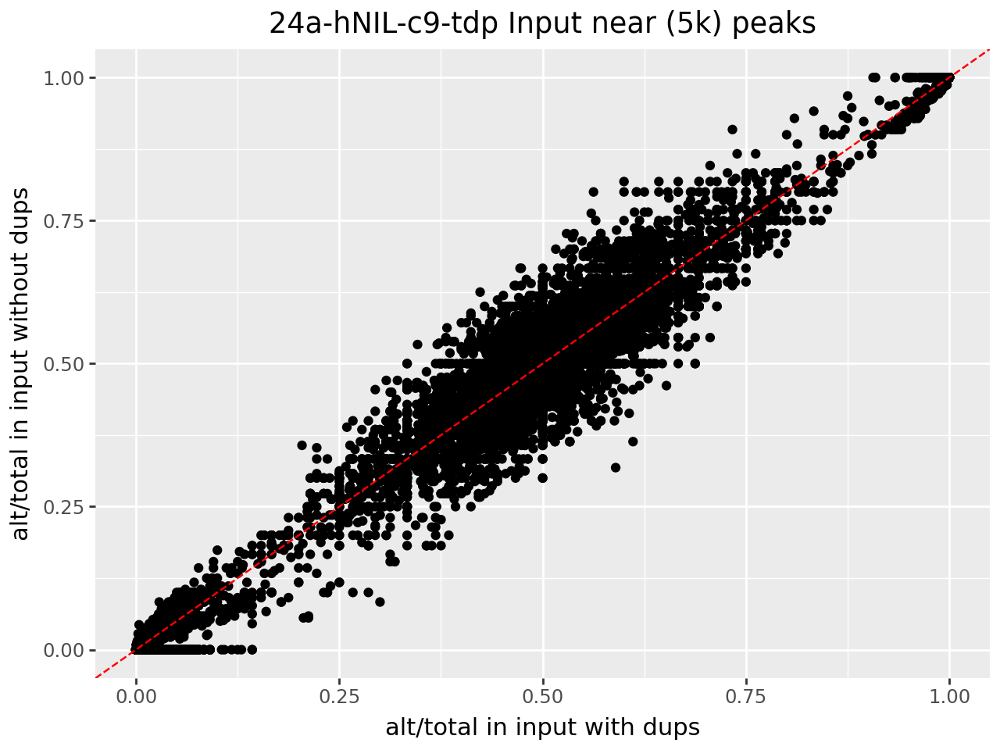

...

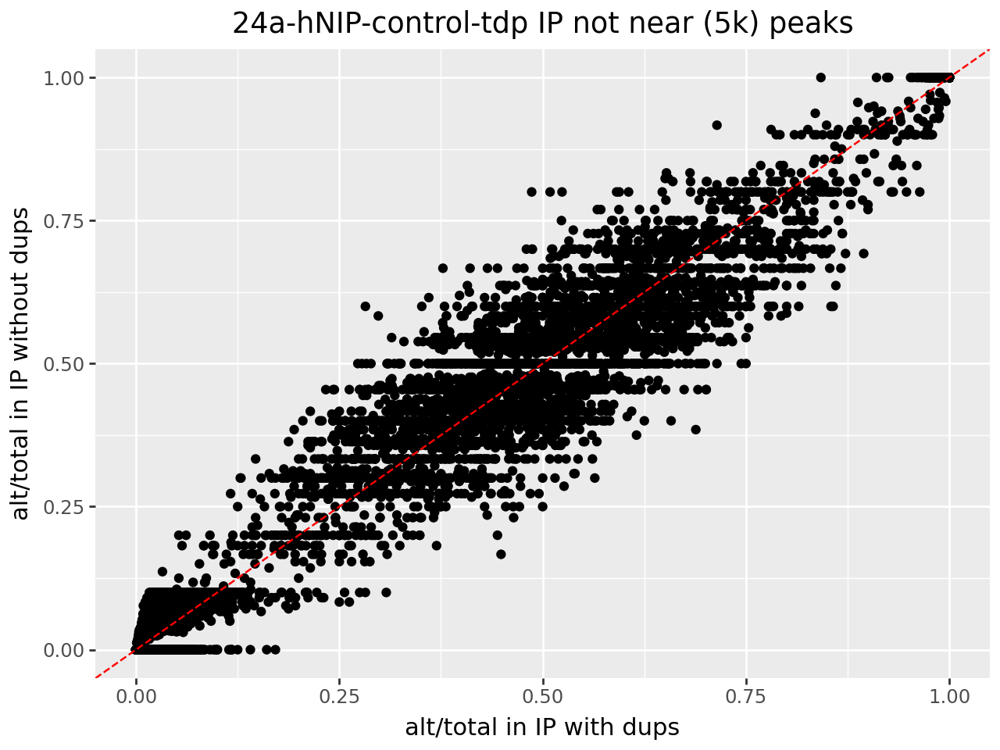

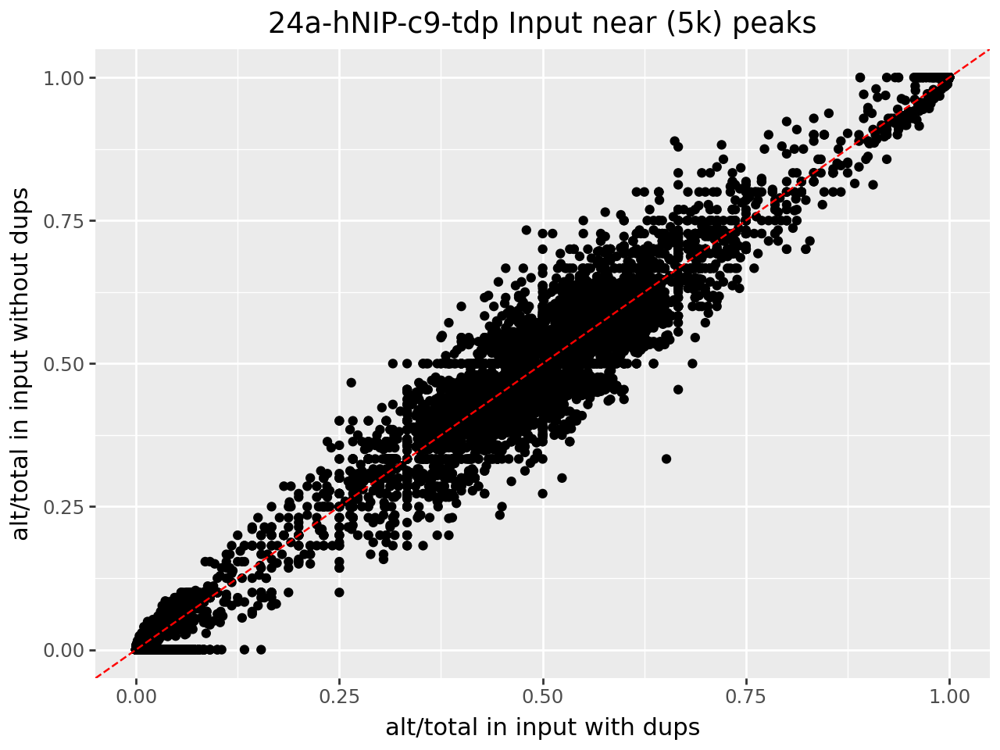

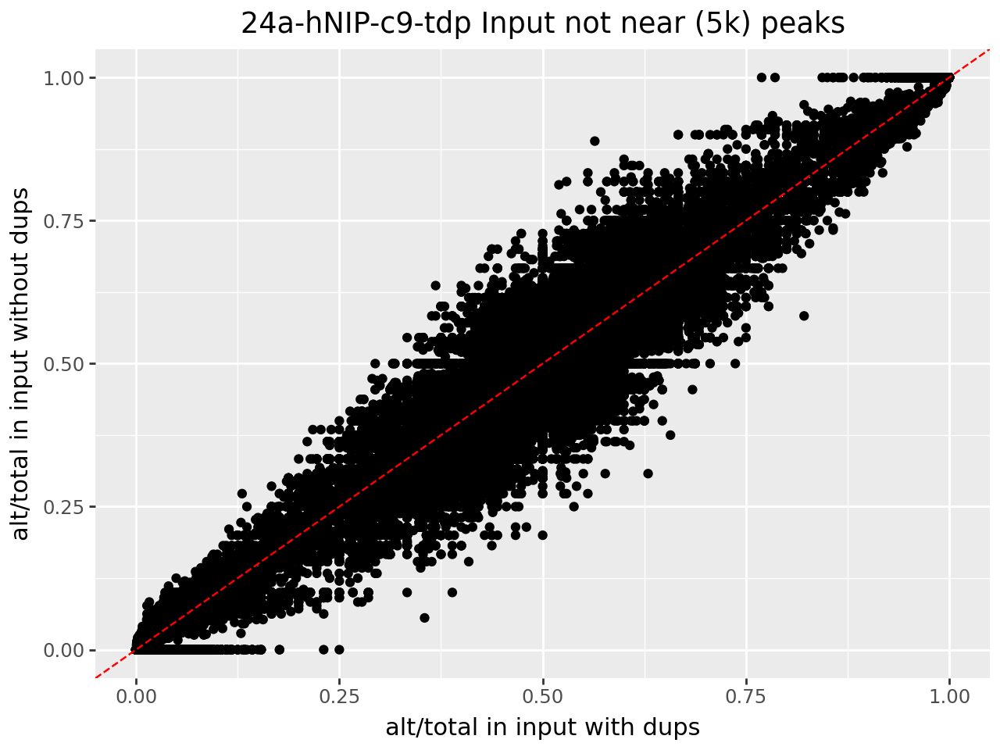

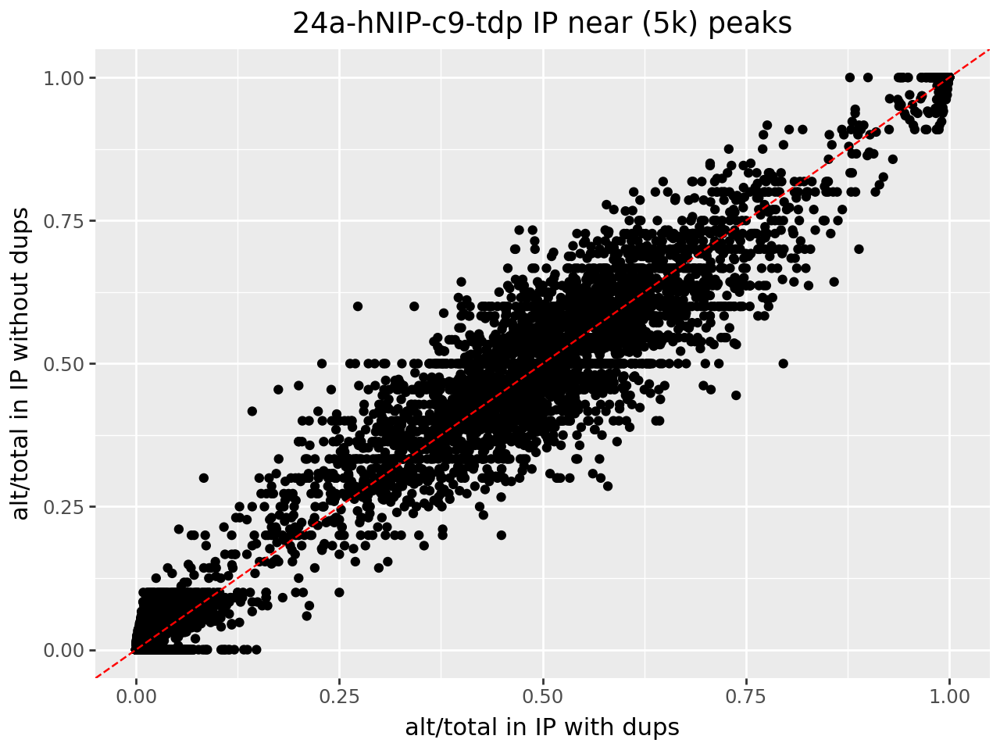

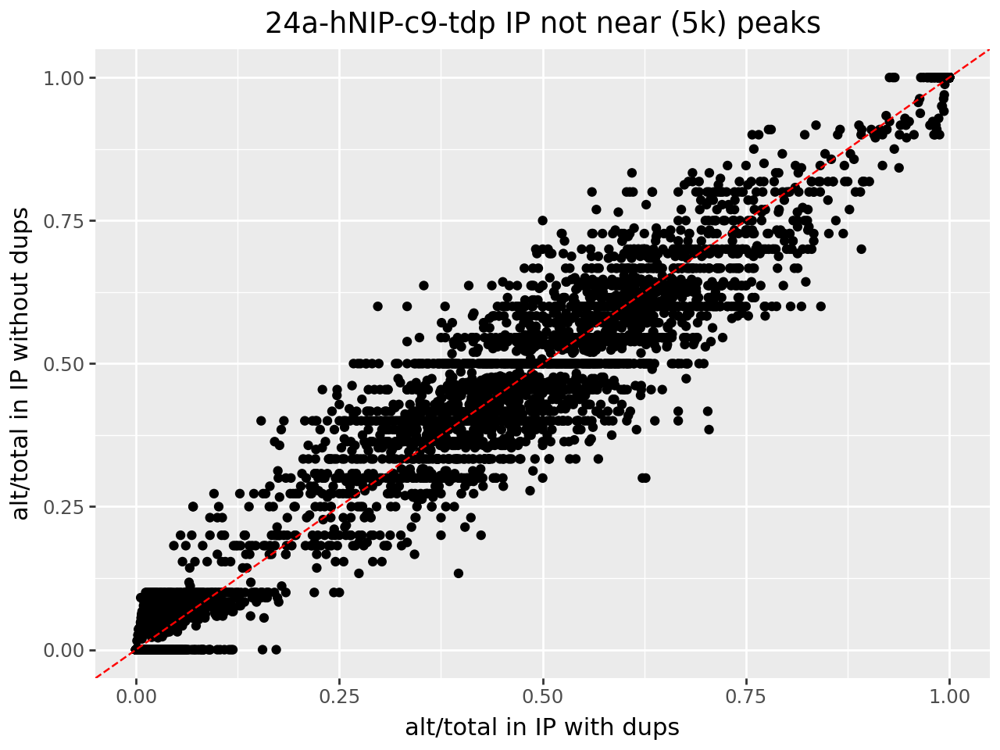

In [68]:
for i in range(4):
    x = pl.read_csv(input_files[i],separator="\t", truncate_ragged_lines=True)
    y = pl.read_csv(input_files_deduped[i],separator ="\t", truncate_ragged_lines=True)
    joint = x.join(y, on=["contig", "position", "variantID", "refAllele", "altAllele"], how='inner')
    joint = annotate_data(joint.to_pandas(), rbps[i])
    
    p1 = (p9.ggplot(joint[joint["near_peak_5k"] == 1], p9.aes(x="altCount / totalCount", y = "altCount_right / totalCount_right")) +
         p9.geom_point() +  # Color points by density
     p9.geom_abline(slope = 1, intercept = 0, color="red", linetype="dashed") +
     p9.labs(x = "alt/total in input with dups", y = "alt/total in input without dups", title=f"{rbps[i]} Input near (5k) peaks")
    )
    p2 = (p9.ggplot(joint[joint["near_peak_5k"] == 0], p9.aes(x="altCount / totalCount", y = "altCount_right / totalCount_right")) +
         p9.geom_point() +  # Color points by density
     p9.geom_abline(slope = 1, intercept = 0, color="red", linetype="dashed") +
     p9.labs(x = "alt/total in input with dups", y = "alt/total in input without dups", title=f"{rbps[i]} Input not near (5k) peaks")
    )
    p1.show()
    p2.show()
    
    x = pl.read_csv(ip_files[i],separator="\t", truncate_ragged_lines=True)
    y = pl.read_csv(ip_files_deduped[i],separator ="\t", truncate_ragged_lines=True)
    joint = x.join(y, on=["contig", "position", "variantID", "refAllele", "altAllele"], how='inner')
    joint = annotate_data(joint.to_pandas(), rbps[i])
    
    p3 = (p9.ggplot(joint[joint["near_peak_5k"] == 1], p9.aes(x="altCount / totalCount", y = "altCount_right / totalCount_right")) +
         p9.geom_point() +  # Color points by density
     p9.geom_abline(slope = 1, intercept = 0, color="red", linetype="dashed") +
     p9.labs(x = "alt/total in IP with dups", y = "alt/total in IP without dups", title=f"{rbps[i]} IP near (5k) peaks")
    )
    p4 = (p9.ggplot(joint[joint["near_peak_5k"] == 0], p9.aes(x="altCount / totalCount", y = "altCount_right / totalCount_right")) +
         p9.geom_point() +  # Color points by density
     p9.geom_abline(slope = 1, intercept = 0, color="red", linetype="dashed") +
     p9.labs(x = "alt/total in IP with dups", y = "alt/total in IP without dups", title=f"{rbps[i]} IP not near (5k) peaks")
    )
    p3.show()
    p4.show()

In [30]:
#joint = annotate_data(joint.to_pandas(), rbps[i])
joint=pl.DataFrame(joint)

In [ ]:
#    peaks_pos = pl.read_csv(peaks_file_pos,
#                            has_header = False, 
#                        new_columns = ["chrom", "start", "end", "name", "score", "strand", "signalValue", "pValue", "qValue", "peak"],
#                        separator = "\t")  
#    peaks_neg = pl.read_csv(peaks_file_neg, 
#                            has_header = False, 
#                        new_columns= ["chrom", "start", "end", "name", "score", "strand", "signalValue", "pValue", "qValue", "peak"],
#                        separator = "\t")  

In [ ]:
x=joint["altCount"] / joint["totalCount"], y = joint["altCount_right"] / joint["totalCount_right"]

In [59]:
joint

,chrom,position,variantID,refAllele,altAllele,refCount,altCount,totalCount,lowMAPQDepth,lowBaseQDepth,...,rawDepth_right,otherBases_right,in_peak_pos,in_peak_neg,in_peak,near_peak_100k,in_exon,in_transcript,in_gene,in_utr
199,chr1,949435,rs4246503,A,G,0,10,10,0,0,...,10,0,0,1,1,1,0,1,1,0
200,chr1,949451,rs187164087,G,A,11,0,11,0,0,...,11,0,0,1,1,1,0,1,1,0
201,chr1,949474,rs922643646,G,A,10,0,10,0,0,...,10,0,0,1,1,1,0,1,1,0
202,chr1,949478,rs1276402342,A,G,10,0,10,0,0,...,10,0,0,1,1,1,0,1,1,0
203,chr1,949490,rs192714326,G,A,10,0,10,0,0,...,10,0,0,1,1,1,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2130503,chr22,50467328,rs187441948,C,T,18,0,18,0,0,...,15,0,0,1,1,1,1,1,1,0
2130504,chr22,50467421,rs146989767,G,A,92,0,92,0,0,...,56,0,0,1,1,1,1,1,1,0
2130505,chr22,50467580,rs550081409,C,T,121,0,121,0,0,...,59,0,0,1,1,1,1,1,1,0
2130506,chr22,50467679,rs6010103,G,A,95,0,95,0,0,...,45,1,0,1,1,1,1,1,1,0


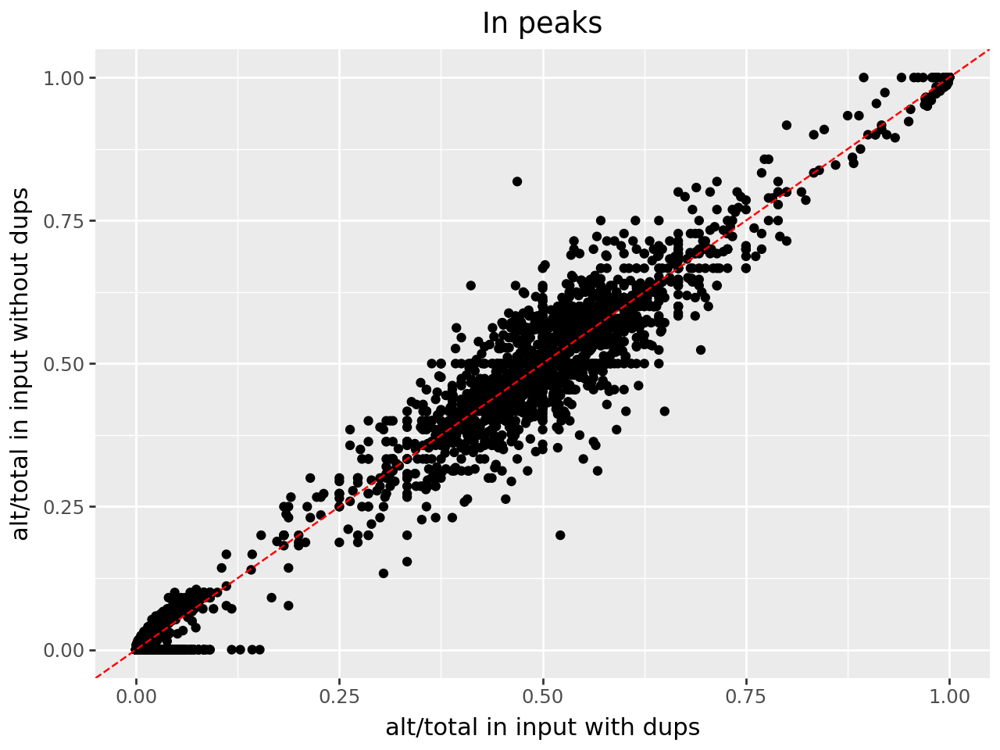

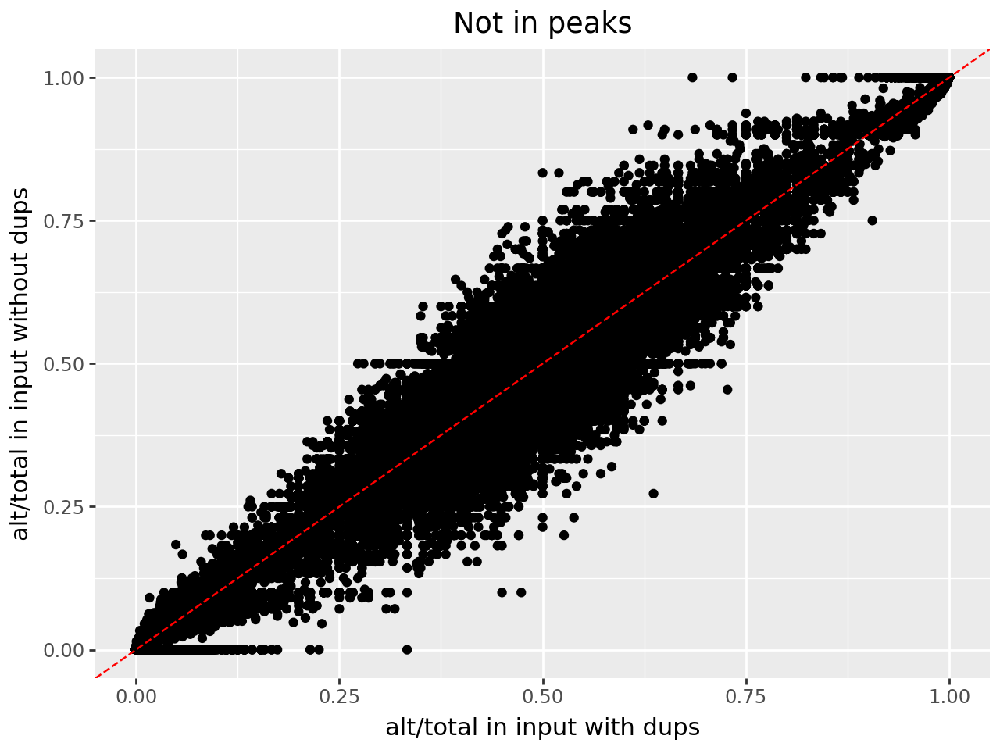

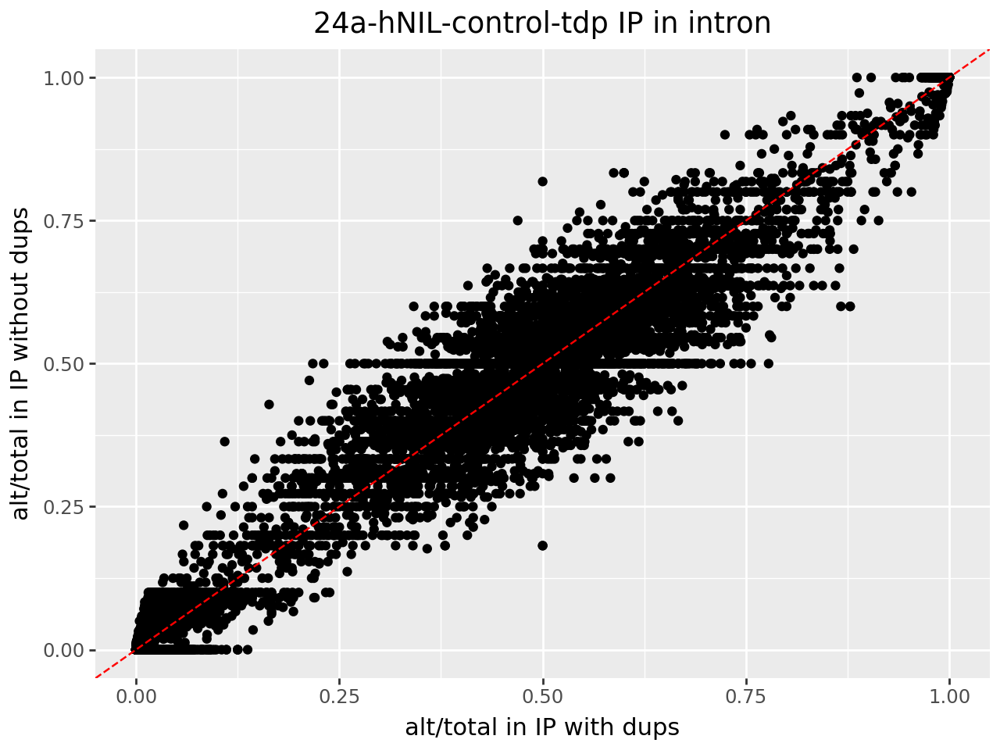

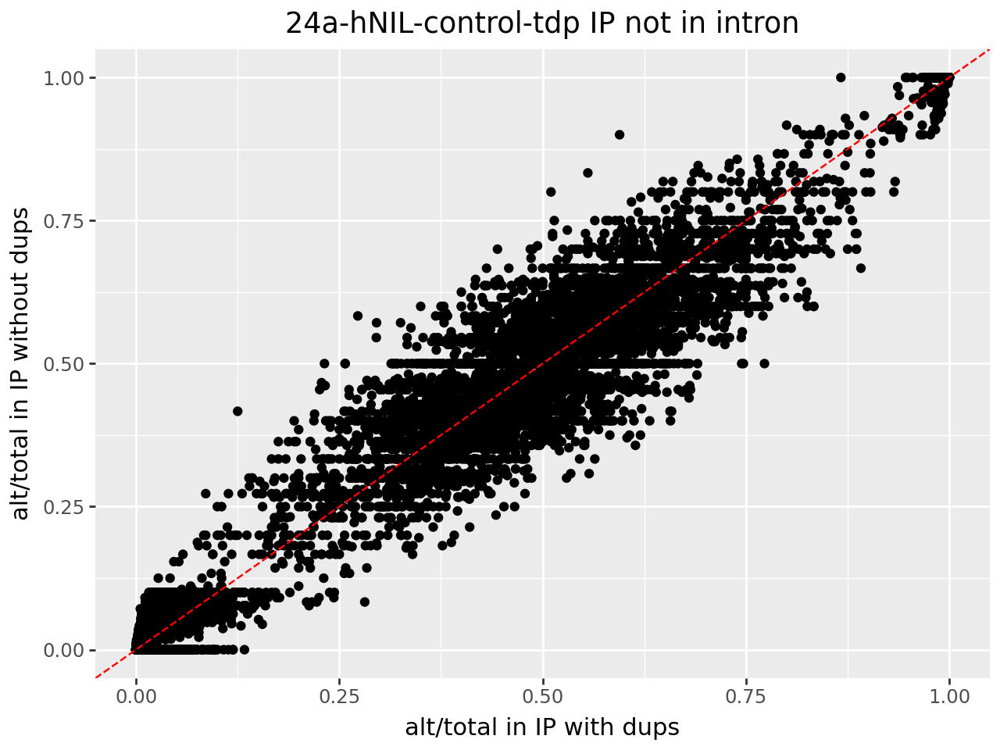

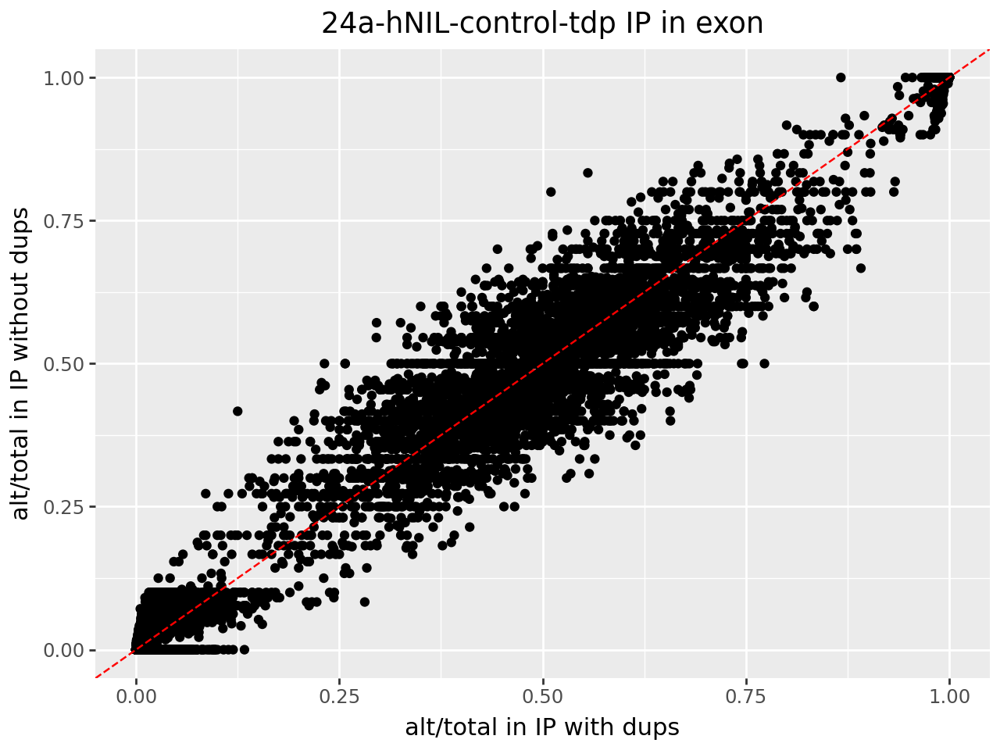

In [82]:
p3 = (p9.ggplot(joint[(joint["in_exon"] == 0) & (joint["in_transcript"] == 1)], p9.aes(x="altCount / totalCount", y = "altCount_right / totalCount_right")) +
     p9.geom_point() +  # Color points by density
 p9.geom_abline(slope = 1, intercept = 0, color="red", linetype="dashed") +
 p9.labs(x = "alt/total in IP with dups", y = "alt/total in IP without dups", title=f"{rbps[i]} IP in intron")
)
p4 = (p9.ggplot(joint[~((joint["in_exon"] == 0) & (joint["in_transcript"] == 1))], p9.aes(x="altCount / totalCount", y = "altCount_right / totalCount_right")) +
     p9.geom_point() +  # Color points by density
 p9.geom_abline(slope = 1, intercept = 0, color="red", linetype="dashed") +
 p9.labs(x = "alt/total in IP with dups", y = "alt/total in IP without dups", title=f"{rbps[i]} IP not in intron")
)
p5 = (p9.ggplot(joint[joint["in_exon"] == 1], p9.aes(x="altCount / totalCount", y = "altCount_right / totalCount_right")) +
     p9.geom_point() +  # Color points by density
 p9.geom_abline(slope = 1, intercept = 0, color="red", linetype="dashed") +
 p9.labs(x = "alt/total in IP with dups", y = "alt/total in IP without dups", title=f"{rbps[i]} IP in exon")
)
p3.show()
p4.show()
p5.show()

In [79]:
joint[((joint["in_exon"] == 0) & (joint["in_transcript"] == 1))].shape, joint[~((joint["in_exon"] == 0) & (joint["in_transcript"] == 1))].shape

((171691, 28), (184994, 28))

In [73]:
for i in range(4):
    x = pl.read_csv(ip_files[i],separator="\t", truncate_ragged_lines=True)
    y = pl.read_csv(ip_files_deduped[i],separator ="\t", truncate_ragged_lines=True)
    joint = x.join(y, on=["contig", "position", "variantID", "refAllele", "altAllele"], how='inner')
    joint = annotate_data(joint.to_pandas(), rbps[i])
    break

In [120]:

r1 = joint["altCount"]/joint["totalCount"]
r2 = joint["altCount_right"]/joint["totalCount_right"]
rdiff = pd.Series(np.abs(np.log10(r1/r2))) # total log-fold diff between ratios

contig,position,variantID,refAllele,altAllele,refCount,altCount,totalCount,lowMAPQDepth,lowBaseQDepth,rawDepth,otherBases
str,i64,str,str,str,i64,i64,i64,i64,i64,i64,i64
"""chr1""",785991,"""rs539194939""","""G""","""A""",22,0,22,0,0,22,0
"""chr1""",788446,"""chr1:788446""","""G""","""C""",14,0,14,0,0,14,0
"""chr1""",829006,"""rs1013133573""","""C""","""G""",45,0,45,0,0,45,0
"""chr1""",829074,"""chr1:829074""","""GC""","""G""",35,0,35,0,0,35,0
"""chr1""",830518,"""rs1446754643""","""G""","""A""",17,0,17,0,0,17,0
…,…,…,…,…,…,…,…,…,…,…,…
"""chr22""",50733001,"""rs531974442""","""G""","""T""",81,0,81,0,0,81,0
"""chr22""",50733053,"""chr22:50733053""","""G""","""A""",64,0,64,0,0,64,0
"""chr22""",50733121,"""chr22:50733121""","""G""","""A""",51,0,51,0,0,51,0


In [ ]:
duprate = x

In [137]:
r1 = joint["altCount"]/joint["totalCount"]
r2 = joint["altCount_right"]/joint["totalCount_right"]
joint["duprate"] = joint["totalCount"]/joint["totalCount_right"]

rdiff = pd.Series(np.abs(np.log10(r1/r2))) # total log-fold diff between ratios
rdiff[np.isinf(rdiff)] = -np.inf

joint['rdiff'] = rdiff

/gpfs/commons/home/dmeyer/venv/poolqtl/lib/python3.12/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 319279 rows containing missing values.


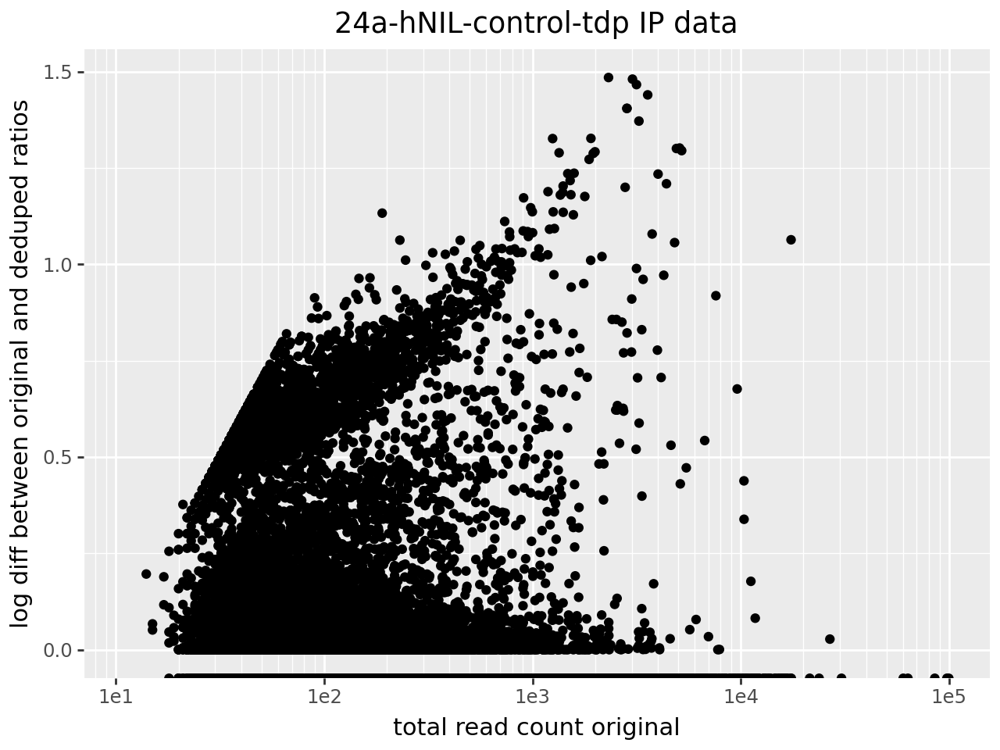

/gpfs/commons/home/dmeyer/venv/poolqtl/lib/python3.12/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 319279 rows containing missing values.


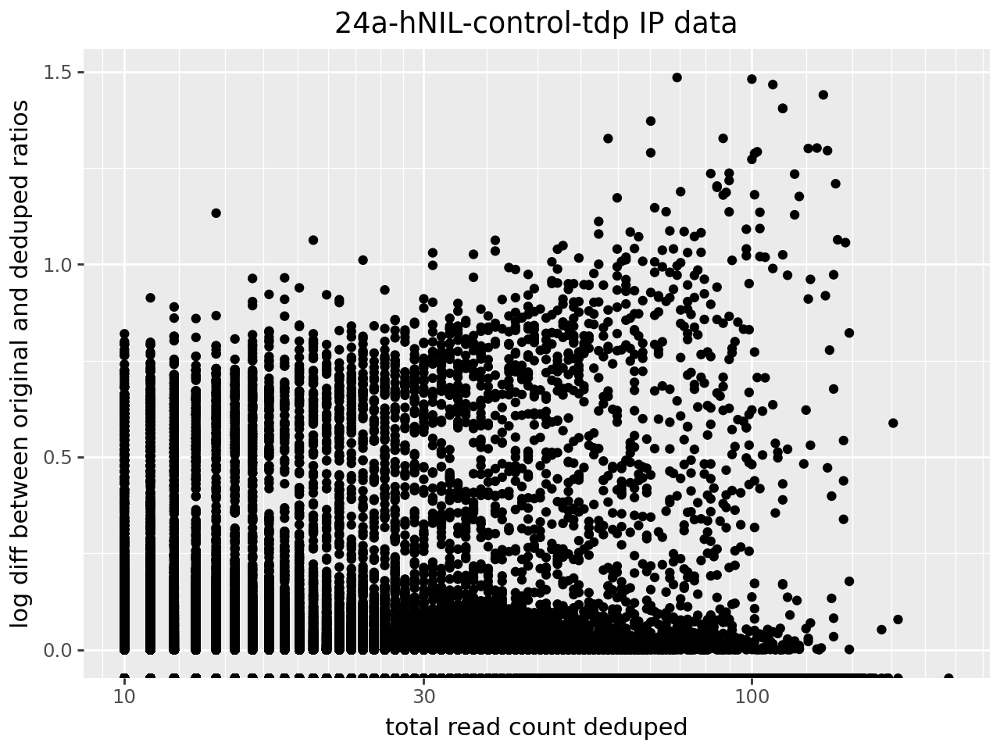

In [138]:
# Want to plot that badboy against totalCounts
p6 = (p9.ggplot(joint, p9.aes(y="rdiff", x = "totalCount")) +
      #p9.geom_abline(slope=0, intercept=0, color='red', linetype='dashed')+
      p9.geom_point() +
      p9.scale_x_log10()+
 p9.labs(y = "log diff between original and deduped ratios", x = "total read count original", title=f"{rbps[i]} IP data")
)
p6.show()
p7 = (p9.ggplot(joint, p9.aes(y="rdiff", x = "totalCount_right")) +
      #p9.geom_abline(slope=0, intercept=0, color='red', linetype='dashed')+
     p9.geom_point() +
      #p9.geom_density_2d()+
      #p9.scale_x_log10()+
 p9.labs(y = "log diff between original and deduped ratios", x = "total read count deduped", title=f"{rbps[i]} IP data")
)
p7.show()

/gpfs/commons/home/dmeyer/venv/poolqtl/lib/python3.12/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 319279 rows containing missing values.


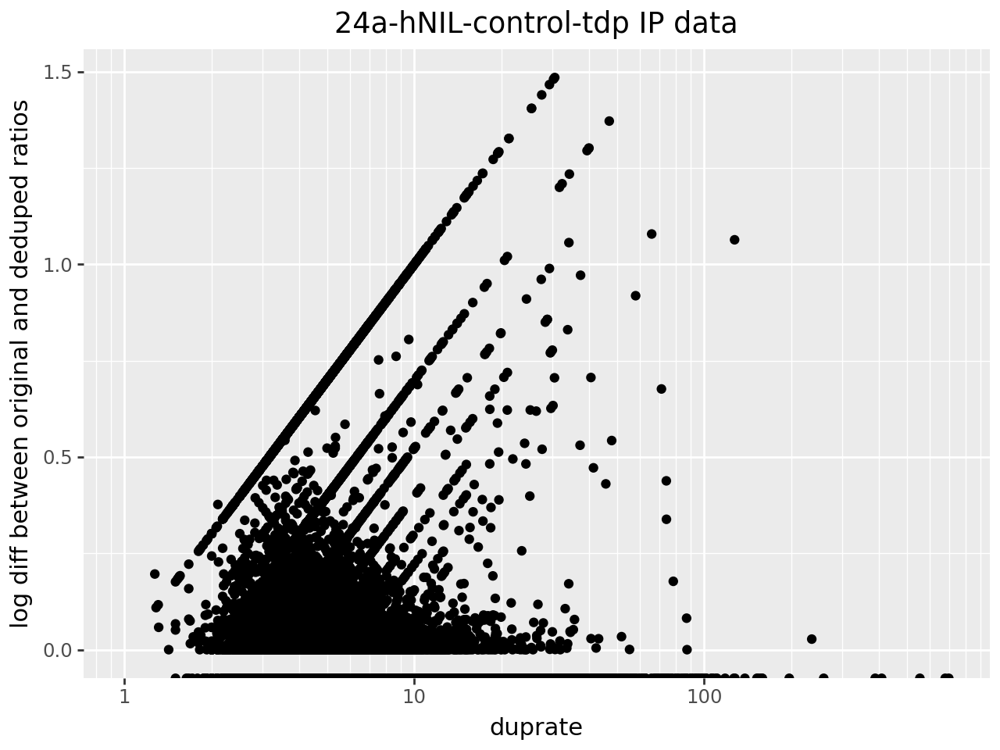

In [140]:
p8 = (p9.ggplot(joint, p9.aes(y="rdiff", x = "duprate")) +
      #p9.geom_abline(slope=0, intercept=0, color='red', linetype='dashed')+
     p9.geom_point() +
      #p9.geom_density_2d()+
      p9.scale_x_log10()+
 p9.labs(y = "log diff between original and deduped ratios", x = "duprate", title=f"{rbps[i]} IP data")
)
p8.show()

In [104]:
np.log10(0.06/0.8)

-1.1249387366083

In [110]:
tmp=pl.Series(joint["rdiff"])

In [114]:
tmp.filter(pl.Series.is_finite(tmp)).max()

1.484487156357196

In [118]:
np.abs(np.log10(0))

/tmp/ipykernel_2224/2218869757.py:1: RuntimeWarning: divide by zero encountered in log10


inf

# Checking for sample swaps

module load qtltools/1.1


In [19]:
bamstats = ["/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIL-control-tdp/alignment/24a-hNIL-control-tdp_ip_Aligned_q20.sort.bamstat",
"/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIL-control-tdp/alignment/24a-hNIL-control-tdp_input_Aligned_q20.sort.bamstat",
"/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIL-c9-tdp/alignment/24a-hNIL-c9-tdp_ip_Aligned_q20.sort.bamstat",
"/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIL-c9-tdp/alignment/24a-hNIL-c9-tdp_input_Aligned_q20.sort.bamstat",
"/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIP-c9-tdp/alignment/24a-hNIP-c9-tdp_ip_Aligned_q20.sort.bamstat",
"/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIP-c9-tdp/alignment/24a-hNIP-c9-tdp_input_Aligned_q20.sort.bamstat",
"/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIP-control-tdp/alignment/24a-hNIP-control-tdp_ip_Aligned_q20.sort.bamstat",
"/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIP-control-tdp/alignment/24a-hNIP-control-tdp_input_Aligned_q20.sort.bamstat"]

In [173]:
def g():
    for f in bamstats:
        x = pl.read_csv(f, separator=" ", has_header=True)
        res = x.filter(x["n_hom_consistent"] == x["n_hom_consistent"].max())
        yield res
res = pl.concat(list(g()))

In [182]:
x.plot.scatter(x="SampleID", y = "n_het_consistent")

:Scatter   [SampleID]   (n_het_consistent)

In [183]:
x.plot.scatter(x="SampleID", y = "n_hom_consistent")

:Scatter   [SampleID]   (n_hom_consistent)

In [184]:
res

SampleID,n_geno_missing,n_het_total,n_hom_total,n_het_covered,n_hom_covered,n_het_consistent,n_hom_consistent,perc_het_consistent,perc_hom_consistent,n_het_in_ase
str,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64
"""CTRL-NEUHE723FGT-02545-G""",78504,1536986,32165234,86963,2103163,70883,2058971,0,0,20762
"""CTRL-NEUHE723FGT-02545-G""",78504,1536986,32165234,119746,2851541,118833,2793620,0,0,7501
"""CASE-NEUFV237VCZ-01369-G""",141940,1531289,32107495,77807,1913109,56757,1874499,0,0,17818
"""CASE-NEUFV237VCZ-01369-G""",141940,1531289,32107495,116642,2824301,115686,2766063,0,0,7181
"""CASE-NEUFV237VCZ-01369-G""",141940,1531289,32107495,89307,2195912,59234,2154168,0,0,18466
"""CASE-NEUFV237VCZ-01369-G""",141940,1531289,32107495,109258,2651745,107863,2599531,0,0,7537
"""CASE-NEUFV237VCZ-01369-G""",141940,1531289,32107495,82305,2047602,64629,2007639,0,0,18717
"""CASE-NEUFV237VCZ-01369-G""",141940,1531289,32107495,113927,2764338,112655,2710876,0,0,8274


In [186]:
donors

['CTRL-NEUHE723FGT-02545-G',
 'CASE-NEUFV237VCZ-01369-G',
 'CTRL-NEUHE723FGT-02545-G',
 'CASE-NEUFV237VCZ-01369-G']

In [187]:
expected = ["CTRL-NEUHE723FGT-02545-G",
    "CTRL-NEUHE723FGT-02545-G",
    "CASE-NEUFV237VCZ-01369-G",
    "CASE-NEUFV237VCZ-01369-G",
    "CASE-NEUFV237VCZ-01369-G",
    "CASE-NEUFV237VCZ-01369-G",
    "CTRL-NEUHE723FGT-02545-G",
    "CTRL-NEUHE723FGT-02545-G"]

['/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIL-control-tdp/alignment/24a-hNIL-control-tdp_ip_Aligned_q20.sort.bamstat',
 '/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIL-control-tdp/alignment/24a-hNIL-control-tdp_input_Aligned_q20.sort.bamstat',
 '/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIL-c9-tdp/alignment/24a-hNIL-c9-tdp_ip_Aligned_q20.sort.bamstat',
 '/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIL-c9-tdp/alignment/24a-hNIL-c9-tdp_input_Aligned_q20.sort.bamstat',
 '/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIP-c9-tdp/alignment/24a-hNIP-c9-tdp_ip_Aligned_q20.sort.bamstat',
 '/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIP-c9-tdp/alignment/24a-hNIP-c9-tdp_input_Aligned_q20.sort.bamstat',
 '/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIP-control-tdp/alignment/24a-hNIP-control-tdp_ip_Aligned_q20.sort.bamstat',
 '/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIP-control-tdp/alignment/24a-hNIP-c

In [210]:
pl.DataFrame({
    "ID": ['24a-hNIL-control-tdp_IP',
     '24a-hNIL-control-tdp_input',
     '24a-hNIL-c9-td_IP',
     '24a-hNIL-c9-tdp_input',
     '24a-hNIP-c9-tdp_IP',
     '24a-hNIP-c9-tdp_input',
     '24a-hNIP-control-tdp_IP',
     '24a-hNIP-control-tdp_input'],
    "expected": expected,
    "actual": res["SampleID"],
    "match": res["SampleID"] == pl.Series(expected),
    "pct_hom_consistent": res["n_hom_consistent"]/res["n_hom_covered"]*100,
    "pct_het_consistent": res["n_het_consistent"]/res["n_het_covered"]*100
}).to_pandas()

,ID,expected,actual,match,pct_hom_consistent,pct_het_consistent
0,24a-hNIL-control-tdp_IP,CTRL-NEUHE723FGT-02545-G,CTRL-NEUHE723FGT-02545-G,True,97.898784,81.509378
1,24a-hNIL-control-tdp_input,CTRL-NEUHE723FGT-02545-G,CTRL-NEUHE723FGT-02545-G,True,97.968782,99.237553
2,24a-hNIL-c9-td_IP,CASE-NEUFV237VCZ-01369-G,CASE-NEUFV237VCZ-01369-G,True,97.981819,72.945879
3,24a-hNIL-c9-tdp_input,CASE-NEUFV237VCZ-01369-G,CASE-NEUFV237VCZ-01369-G,True,97.937968,99.180398
4,24a-hNIP-c9-tdp_IP,CASE-NEUFV237VCZ-01369-G,CASE-NEUFV237VCZ-01369-G,True,98.099013,66.326268
5,24a-hNIP-c9-tdp_input,CASE-NEUFV237VCZ-01369-G,CASE-NEUFV237VCZ-01369-G,True,98.030957,98.723206
6,24a-hNIP-control-tdp_IP,CTRL-NEUHE723FGT-02545-G,CASE-NEUFV237VCZ-01369-G,False,98.048302,78.523783
7,24a-hNIP-control-tdp_input,CTRL-NEUHE723FGT-02545-G,CASE-NEUFV237VCZ-01369-G,False,98.066011,98.883496


In [387]:
import hvplot

hvplot.extension('matplotlib')

:Scatter   [SampleID]   (n_het_consistent)
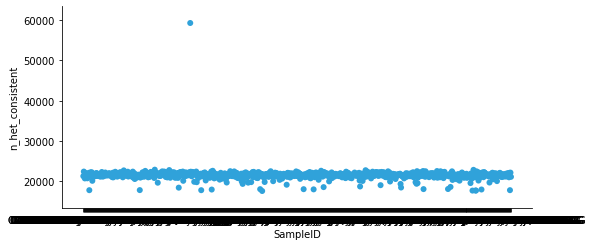

In [388]:
f = '/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIP-c9-tdp/alignment/24a-hNIP-c9-tdp_ip_Aligned_q20.sort.bamstat'
x = pl.read_csv(f, separator=" ", has_header=True)
p = x.plot.scatter(x="SampleID", y = "n_het_consistent")
p

In [233]:
f = '/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIP-control-tdp/alignment/24a-hNIP-control-tdp_ip_Aligned_q20.sort.bamstat'
x = pl.read_csv(f, separator=" ", has_header=True)
p = x.plot.scatter(x="SampleID", y = "n_het_consistent")
p

:Scatter   [SampleID]   (n_het_consistent)

In [234]:
f = '/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIP-control-tdp/alignment/24a-hNIP-control-tdp_input_Aligned_q20.sort.bamstat'
x = pl.read_csv(f, separator=" ", has_header=True)
x.plot.scatter(x="SampleID", y = "n_het_consistent")

:Scatter   [SampleID]   (n_het_consistent)

In [235]:
bamstats

['/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIL-control-tdp/alignment/24a-hNIL-control-tdp_ip_Aligned_q20.sort.bamstat',
 '/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIL-control-tdp/alignment/24a-hNIL-control-tdp_input_Aligned_q20.sort.bamstat',
 '/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIL-c9-tdp/alignment/24a-hNIL-c9-tdp_ip_Aligned_q20.sort.bamstat',
 '/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIL-c9-tdp/alignment/24a-hNIL-c9-tdp_input_Aligned_q20.sort.bamstat',
 '/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIP-c9-tdp/alignment/24a-hNIP-c9-tdp_ip_Aligned_q20.sort.bamstat',
 '/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIP-c9-tdp/alignment/24a-hNIP-c9-tdp_input_Aligned_q20.sort.bamstat',
 '/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIP-control-tdp/alignment/24a-hNIP-control-tdp_ip_Aligned_q20.sort.bamstat',
 '/gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIP-control-tdp/alignment/24a-hNIP-c

In [ ]:
!ls /gpfs/commons/groups/knowles_lab/bindingQTL_share/24a-hNIL-control-tdp/alignment/24a-hNIL-control-tdp_ip_Aligned_q20.sort.bamstat',


In [241]:
rbps

['24a-hNIL-control-tdp',
 '24a-hNIL-c9-tdp',
 '24a-hNIP-control-tdp',
 '24a-hNIP-c9-tdp']

### Check expression data to see if cell types cluster together

In [236]:
input_features = pl.Series([basedir / rbp / f"features/{rbp}_input_hg38_basicv41_genes_fc.txt" for rbp in rbps])
ip_features = pl.Series([basedir / rbp / f"features/{rbp}_ip_hg38_basicv41_genes_fc.txt" for rbp in rbps])

In [271]:
f = input_features[0]
y = [pl.read_csv(f, separator="\t", has_header=True, comment_prefix="#")[:,-1].to_list() for f in ip_features]

In [283]:
x = [pl.read_csv(f, separator="\t", has_header=True, comment_prefix="#")[:,-1].to_list() for f in input_features]
y = [pl.read_csv(f, separator="\t", has_header=True, comment_prefix="#")[:,-1].to_list() for f in ip_features]
dat = pl.concat([pl.DataFrame(np.array(x).T, [rbp+"_input" for rbp in rbps]),
                 pl.DataFrame(np.array(y).T, [rbp+"_IP" for rbp in rbps])],
                how="horizontal")

In [301]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

In [302]:
from sklearn.preprocessing import StandardScaler

In [303]:
dat_std = StandardScaler().fit_transform(dat)

In [390]:
dat_pca = PCA(2).fit_transform(dat_std.T)

In [391]:
d2 = pl.DataFrame(dat_pca, [f"PC{i+1}" for i in range(2)])

d2.insert_column(0, pl.Series("CellType", ['hNIL', 'hNIL', 'hNIP', 'hNIP', 'hNIL', 'hNIL', 'hNIP', 'hNIP']))
d2.insert_column(1, pl.Series("LibPrep", ['input', 'input', 'input', 'input', 'IP', 'IP', 'IP', 'IP']))
d2.insert_column(2, pl.Series("Donor", ['control', 'case', 'control', 'case', 'control', 'case', 'control', 'case']))
d2.insert_column(3, pl.Series("Sample", ['hNIL-ctl_input', 'hNIL-c9_input', 
                                         'hNIP-ctl_input', 'hNIP-c9_input', 'hNIL-ctl_IP', 'hNIL-c9_IP', 'hNIP-ctl_IP', 'hNIP-c9_IP']))
#d2.insert_column(2, pl.Series("Sample", ['24a-hNIL-control-tdp_input', '24a-hNIL-c9-tdp_input', '24a-hNIP-control-tdp_input', '24a-hNIP-c9-tdp_input', '24a-hNIL-control-tdp_IP', '24a-hNIL-c9-tdp_IP', '24a-hNIP-control-tdp_IP', '24a-hNIP-c9-tdp_IP']))
d2

CellType,LibPrep,Donor,Sample,PC1,PC2
str,str,str,str,f64,f64
"""hNIL""","""input""","""control""","""hNIL-ctl_input""",96.522413,-47.247243
"""hNIL""","""input""","""case""","""hNIL-c9_input""",83.165664,-46.29123
"""hNIP""","""input""","""control""","""hNIP-ctl_input""",-67.729595,-57.940434
"""hNIP""","""input""","""case""","""hNIP-c9_input""",-57.265803,-63.089766
"""hNIL""","""IP""","""control""","""hNIL-ctl_IP""",60.219359,63.0515
"""hNIL""","""IP""","""case""","""hNIL-c9_IP""",45.103584,73.471524
"""hNIP""","""IP""","""control""","""hNIP-ctl_IP""",-84.924344,38.351392
"""hNIP""","""IP""","""case""","""hNIP-c9_IP""",-75.09128,39.694257


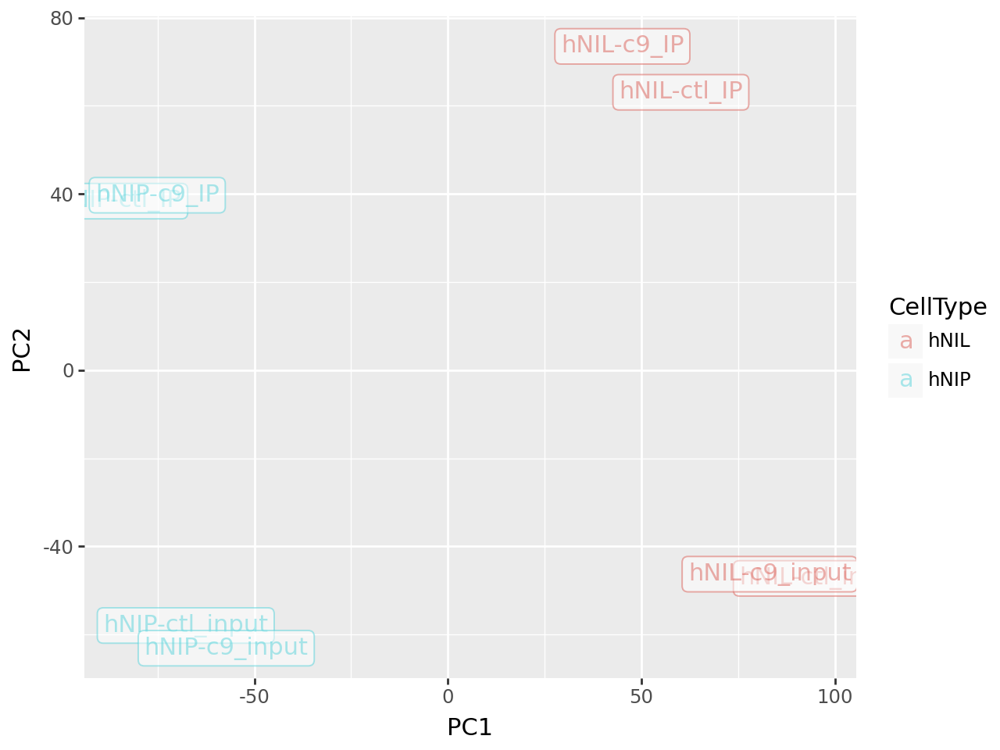

In [392]:
(p9.ggplot(d2, p9.aes(x = "PC1", y = "PC2", color="CellType", label="Sample")) +
 p9.geom_label(alpha=0.5)
)

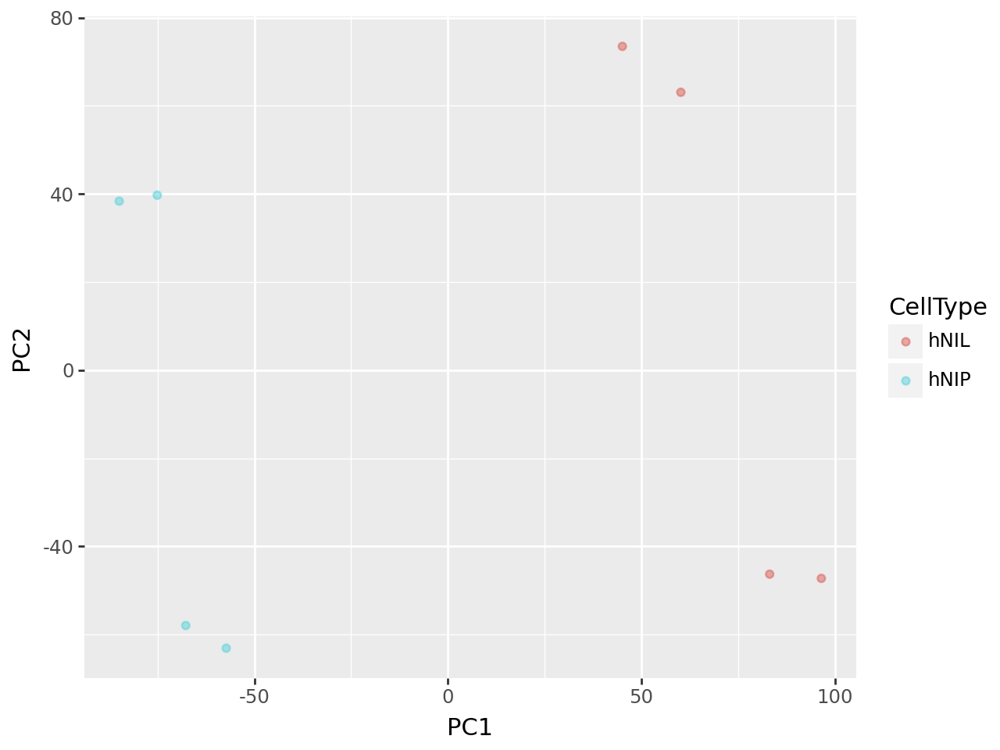

In [393]:
(p9.ggplot(d2, p9.aes(x = "PC1", y = "PC2", color="CellType")) +
 p9.geom_point(alpha=0.5)
)

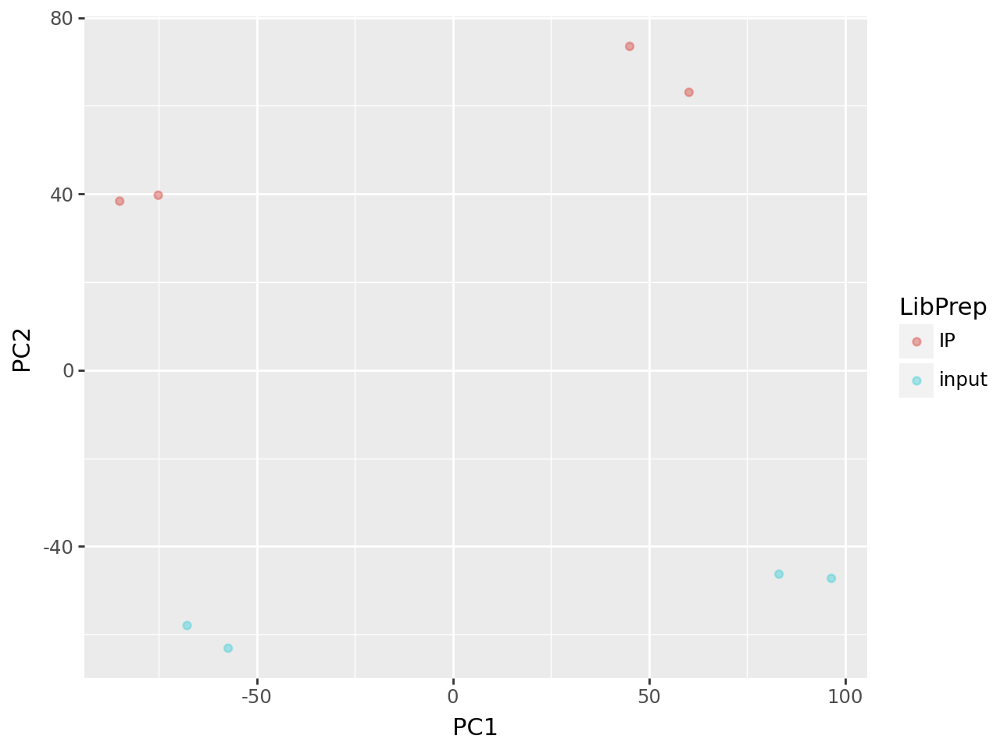

In [394]:
(p9.ggplot(d2, p9.aes(x = "PC1", y = "PC2", color="LibPrep")) +
 p9.geom_point(alpha=0.5) )

# The reverse method

In [404]:
IP_counts_annotated = [annotate_data(IP_counts[i], rbps[i]) for i in range(len(rbps))]

In [ ]:
import pickle
with open("IP_counts_annotated.pickle", "wb") as f:
    pickle.dump(IP_counts_annotated, f)

In [ ]:
import pickle
with open("IP_counts_annotated.pickle", "rb") as f:
    IP_counts_annotated =  pickle.load(f)

In [401]:
i=0
IP_counts_annotated = [annotate_data(IP_counts[i], rbps[i]) for i in range(len(rbps))]

,chrom,position,variantID,refAllele,altAllele,refCount,altCount,totalCount,in_peak_pos,in_peak_neg,in_peak,near_peak_100k,near_peak_5k,in_exon,in_transcript,in_gene,in_utr
0,chr1,785991,rs539194939,G,A,22,0,22,0,0,0,0,1,1,1,1,0
1,chr1,788446,chr1:788446,G,C,14,0,14,1,0,0,1,1,0,1,1,0
2,chr1,829006,rs1013133573,C,G,45,0,45,0,0,0,0,0,1,1,1,0
3,chr1,829074,chr1:829074,GC,G,35,0,35,0,0,0,0,0,1,1,1,0
4,chr1,830518,rs1446754643,G,A,17,0,17,0,0,0,0,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2094388,chr22,50733001,rs531974442,G,T,81,0,81,0,0,0,0,0,1,1,1,1
2094389,chr22,50733053,chr22:50733053,G,A,64,0,64,0,0,0,0,0,1,1,1,1
2094390,chr22,50733121,chr22:50733121,G,A,51,0,51,0,0,0,0,0,1,1,1,1
2094391,chr22,50733125,rs1157485076,C,T,46,0,46,0,0,0,0,0,1,1,1,1


In [453]:
het_snps = [l.strip().rstrip() for l in open("../both_het_snps.txt", "r")]

In [460]:
i = 0
x = pl.from_pandas(IP_counts_annotated[i])
y = pl.from_pandas(input_counts[i]).rename({"contig": "chrom"})
x = x.filter((x["in_intron"] == 1) & (x["in_peak"]==1) & x["variantID"].is_in(het_snps))
x = x.insert_column(8,pl.Series("af_IP",    (x["altCount"]+1)/(x["totalCount"]+1)))
# then we want to look at SNPs that are in introns and in peaks
dat = x.join(y, how="inner", on=["chrom", "position", "variantID", "refAllele", "altAllele"], suffix = "_input")
#dat = dat.insert_column(8,pl.Series("af_IP",    (dat["altCount"]+1)/(dat["totalCount"]+1)))
dat = dat.insert_column(9,pl.Series("af_input", (dat["altCount_input"]+1)/(dat["totalCount_input"]+1)))

In [ ]:
#
#dat = dat.insert_column(8,pl.Series("af_IP", dat["altCount"]/dat["totalCount"]))
#dat = dat.insert_column(9,pl.Series("af_input", dat["altCount_input"]/dat["totalCount_input"]))

In [428]:
from plotnine import ggplot, aes, geom_point, geom_abline, geom_histogram, labs

In [461]:
x.plot.scatter(x = "refCount", y = "altCount", hover_cols = ["variantID"])

:Scatter   [refCount]   (altCount,variantID)

In [444]:
hvplot.extension("bokeh")

In [463]:
dat.plot.scatter(x="af_input", y = "af_IP", hover_cols = ["variantID"])

:Scatter   [af_input]   (af_IP,variantID)

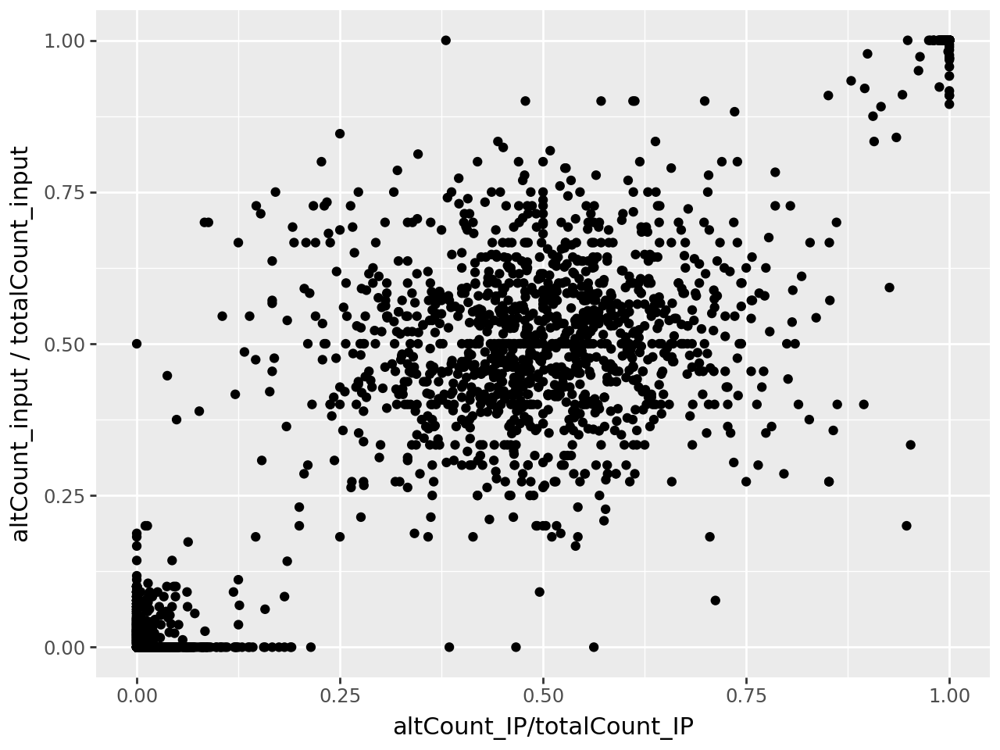

In [429]:
( ggplot(dat, aes(x = "altCount/totalCount", y = "altCount_input / totalCount_input")) +
 geom_point()+
 labs(x = "altCount_IP/totalCount_IP")
)

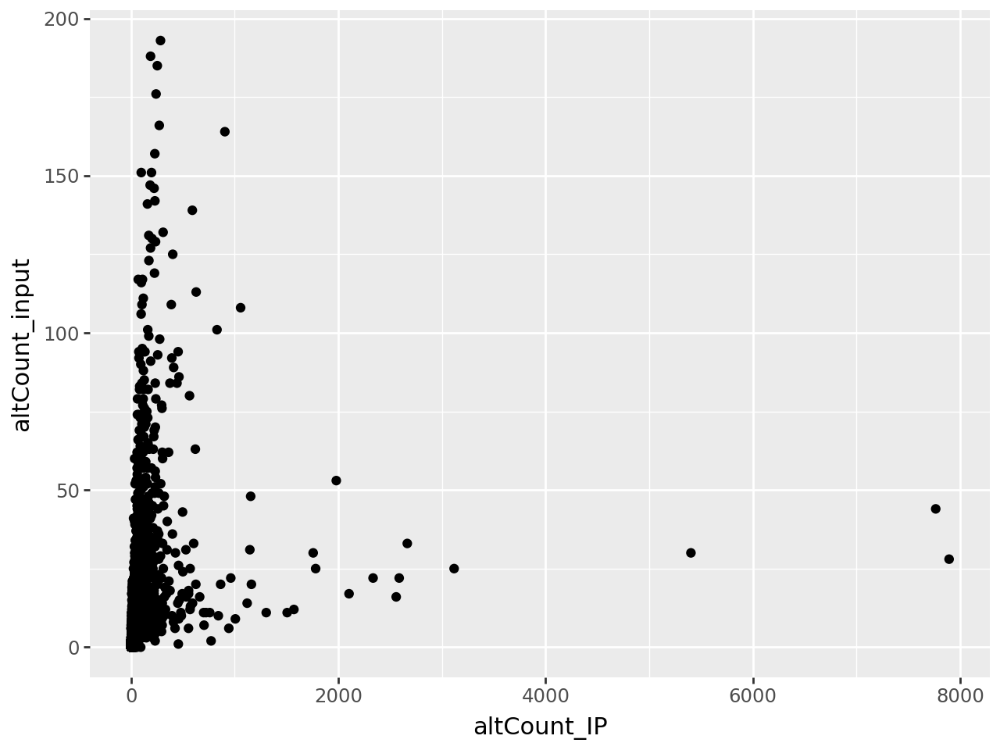

In [432]:
( ggplot(dat, aes(x = "altCount", y = "altCount_input")) +
 geom_point()+
 labs(x = "altCount_IP")
)

In [64]:
[str(x) for x in input_files]

['/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-control-tdp/allelic/24a-hNIL-control-tdp_input_allelic.out',
 '/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-c9-tdp/allelic/24a-hNIL-c9-tdp_input_allelic.out',
 '/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-control-tdp/allelic/24a-hNIP-control-tdp_input_allelic.out',
 '/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-c9-tdp/allelic/24a-hNIP-c9-tdp_input_allelic.out']

# Investigating results of binomial tests

In [20]:
binom_res_files = ["/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-control-tdp/allelic/24a-hNIL-control-tdp_binomresults.txt",
"/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-c9-tdp/allelic/24a-hNIL-c9-tdp_binomresults.txt",
"/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-control-tdp/allelic/24a-hNIP-control-tdp_binomresults.txt",
"/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-c9-tdp/allelic/24a-hNIP-c9-tdp_binomresults.txt"]

In [21]:
binom_res_files_IP = ["/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-control-tdp/allelic/24a-hNIL-control-tdp_binomresults.txt",
"/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-c9-tdp/allelic/24a-hNIL-c9-tdp_binomresults.txt",
"/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-control-tdp/allelic/24a-hNIP-control-tdp_binomresults.txt",
"/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-c9-tdp/allelic/24a-hNIP-c9-tdp_binomresults.txt"]

In [22]:
import rds2py

In [23]:
import pyarrow

In [25]:
bIn = pyarrow.feather.read_feather("binom_results_input_hets.feather")
bIP = pyarrow.feather.read_feather("binom_results_IP_hets.feather")

In [30]:
bIn

,contig,position,variantID,refAllele,altAllele,refCount,altCount,totalCount,lowMAPQDepth,lowBaseQDepth,rawDepth,otherBases,statistic,parameter,p.value,conf.int[1],conf.int[2],estimate,q.value,rbp
0,chr1,908025.0,rs11516185,A,G,9.0,4.0,13.0,0.0,0.0,13.0,0.0,4.0,13.0,0.266846,0.090920,0.614262,0.307692,0.855088,24a-hNIL-control-tdp
1,chr1,1082764.0,rs9442395,T,C,16.0,16.0,32.0,0.0,0.0,32.0,0.0,16.0,32.0,1.000000,0.318875,0.681125,0.500000,1.000000,24a-hNIL-control-tdp
2,chr1,1083182.0,rs9442371,C,T,5.0,5.0,10.0,0.0,0.0,10.0,0.0,5.0,10.0,1.000000,0.187086,0.812914,0.500000,1.000000,24a-hNIL-control-tdp
3,chr1,1100425.0,rs12759295,G,A,10.0,11.0,21.0,0.0,0.0,21.0,0.0,11.0,21.0,1.000000,0.297807,0.742869,0.523810,1.000000,24a-hNIL-control-tdp
4,chr1,1613974.0,rs12066,G,A,16.0,23.0,39.0,0.0,0.0,39.0,0.0,23.0,39.0,0.336784,0.420999,0.744332,0.589744,0.915106,24a-hNIL-control-tdp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152492,chr22,50456591.0,rs5771001,C,T,29.0,24.0,53.0,0.0,0.0,53.0,0.0,24.0,53.0,0.583132,0.315615,0.595502,0.452830,1.000000,24a-hNIP-c9-tdp
152493,chr22,50457956.0,rs4824148,A,G,3.0,7.0,10.0,0.0,0.0,11.0,1.0,7.0,10.0,0.343750,0.347547,0.933260,0.700000,0.897326,24a-hNIP-c9-tdp
152494,chr22,50569023.0,rs15195,C,T,20.0,25.0,45.0,0.0,0.0,45.0,0.0,25.0,45.0,0.551484,0.399973,0.703556,0.555556,1.000000,24a-hNIP-c9-tdp
152495,chr22,50607663.0,rs5770797,G,C,3.0,9.0,12.0,0.0,0.0,12.0,0.0,9.0,12.0,0.145996,0.428142,0.945139,0.750000,0.636248,24a-hNIP-c9-tdp


In [31]:
xlsxfiles = ["/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-control-tdp_binomresults.in_intron_and_peak.xlsx",
                   "/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIL-c9-tdp_binomresults.in_intron_and_peak.xlsx",
                   "/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-control-tdp_binomresults.in_intron_and_peak.xlsx",
                   "/gpfs/commons/home/dmeyer/bindingQTL_share/24a-hNIP-c9-tdp_binomresults.in_intron_and_peak.xlsx"]

In [117]:
qthresh = .05
for i in range(4):
    dat=annotate_data(pl.read_csv(binom_res_files[i], separator = "\t", has_header = True).to_pandas(), rbps[i])
    cols = ["chrom", "position", "variantID", "refAllele", "altAllele", "refCount_input", "altCount_input", "totalCount_input", "refCount_IP", "altCount_IP", "totalCount_IP", "q.value_input", "q.value_IP", "p.value_input", "p.value_IP"]
    cols = cols + [x for x in dat.columns.to_list() if x not in set(cols)]
    
    idx = ((dat["in_peak"] == 1) & 
        (dat["in_gene"] == 1) &
        (dat["in_exon"] == 0) &
        (dat["q.value_IP"] < qthresh))
    #dat[idx].sort_values(ascending = True, by="q.value_IP").to_excel(binom_res_files[i].rstrip(".txt")+".in_intron_and_peak.xlsx")
    dat.loc[idx,cols].sort_values(ascending = True, by="q.value_IP").to_excel(xlsxfiles[i], index=False)

In [17]:
qthresh = .05
for i in range(4):
    dat=annotate_data(pl.read_csv(binom_res_files[i], separator = "\t", has_header = True).to_pandas(), rbps[i])
    cols = ["chrom", "position", "variantID", "refAllele", "altAllele", "refCount_input", "altCount_input", "totalCount_input", "refCount_IP", "altCount_IP", "totalCount_IP", "q.value_input", "q.value_IP", "p.value_input", "p.value_IP"]
    cols = cols + [x for x in dat.columns.to_list() if x not in set(cols)]
    
    idx = (#(dat["in_peak"] == 1) & 
        #(dat["in_gene"] == 1) &
        #(dat["in_exon"] == 0) &
        (dat["q.value_IP"] < qthresh))
    break
#dat.loc[idx,cols].sort_values(by="q.value_IP", ascending=True).loc[2,:]

chrom                       chr1
position                 1616547
variantID              rs7418389
refAllele                      T
altAllele                      C
refCount_input                13
altCount_input                24
totalCount_input              37
refCount_IP                   37
altCount_IP                    9
totalCount_IP                 46
q.value_input           0.515504
q.value_IP              0.000242
p.value_input           0.098872
p.value_IP              0.000041
lowMAPQDepth_input             0
lowBaseQDepth_input            0
rawDepth_input                37
otherBases_input               0
statistic_input               24
parameter_input               37
conf.int[1]_input       0.474611
conf.int[2]_input         0.7979
estimate_input          0.648649
lowMAPQDepth_IP                0
lowBaseQDepth_IP               0
rawDepth_IP                   47
otherBases_IP                  1
statistic_IP                   9
parameter_IP                  46
conf.int[1

In [18]:
dat.loc[dat["variantID"] == "rs2820999", cols].T

,10
chrom,chr1
position,3511596
variantID,rs2820999
refAllele,T
altAllele,G
refCount_input,22
altCount_input,32
totalCount_input,54
refCount_IP,166
altCount_IP,117


In [21]:
dat.loc[dat["variantID"] == "rs12973192", cols] #UNC13A in cryptic exon

,chrom,position,variantID,refAllele,altAllele,refCount_input,altCount_input,totalCount_input,refCount_IP,altCount_IP,...,estimate_IP,in_peak_pos,in_peak_neg,in_peak,near_peak_100k,near_peak_5k,in_exon,in_transcript,in_gene,in_utr


In [93]:
def f():
    qthresh = .05
    for i in range(4):
        dat=annotate_data(pl.read_csv(binom_res_files[i], separator = "\t", has_header = True).to_pandas(), rbps[i])
        
        idx = ((dat["in_peak"] == 1) & 
            (dat["in_gene"] == 1) &
            (dat["in_exon"] == 0) &
            (dat["q.value_IP"] < qthresh) &
            (dat["q.value_input"] < qthresh))
        yield dat[idx].sort_values(ascending = True, by="q.value_IP")
res = list(f())

In [30]:
from plotnine import ggplot, geom_point, aes, geom_abline

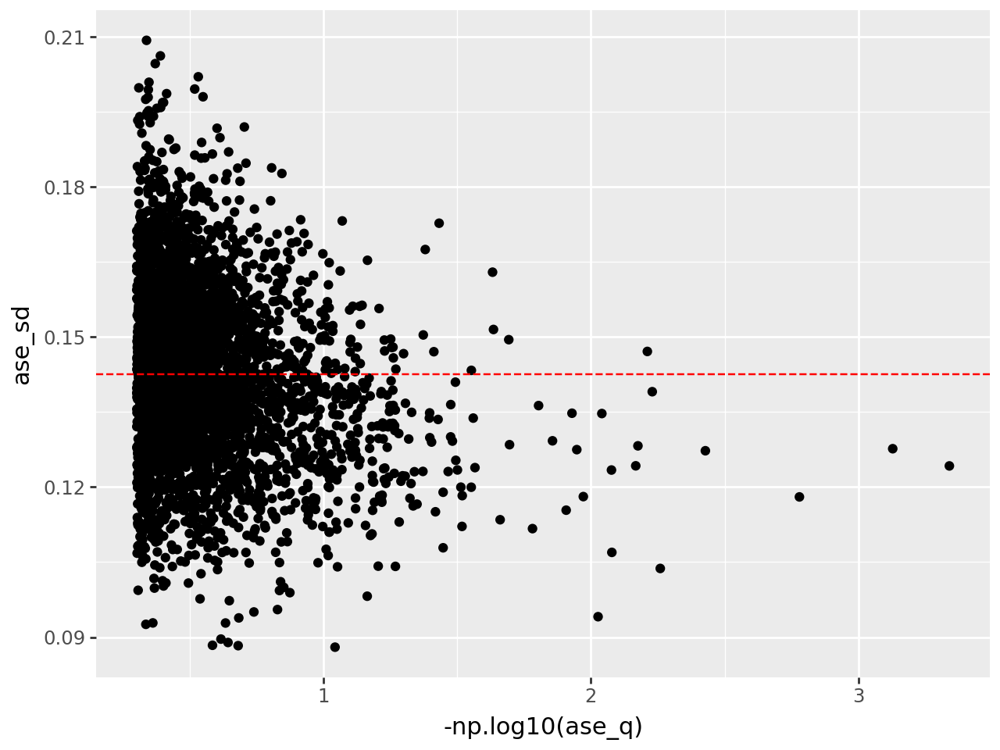

In [32]:
dat = pl.read_csv(results_files[0], separator="\t")

(ggplot(dat, aes(x = "-np.log10(ase_q)", y = "ase_sd"))+
 geom_point()+
 geom_abline(slope = 0, intercept=dat['ase_sd'].mean(), color='red', linetype='dashed')
)

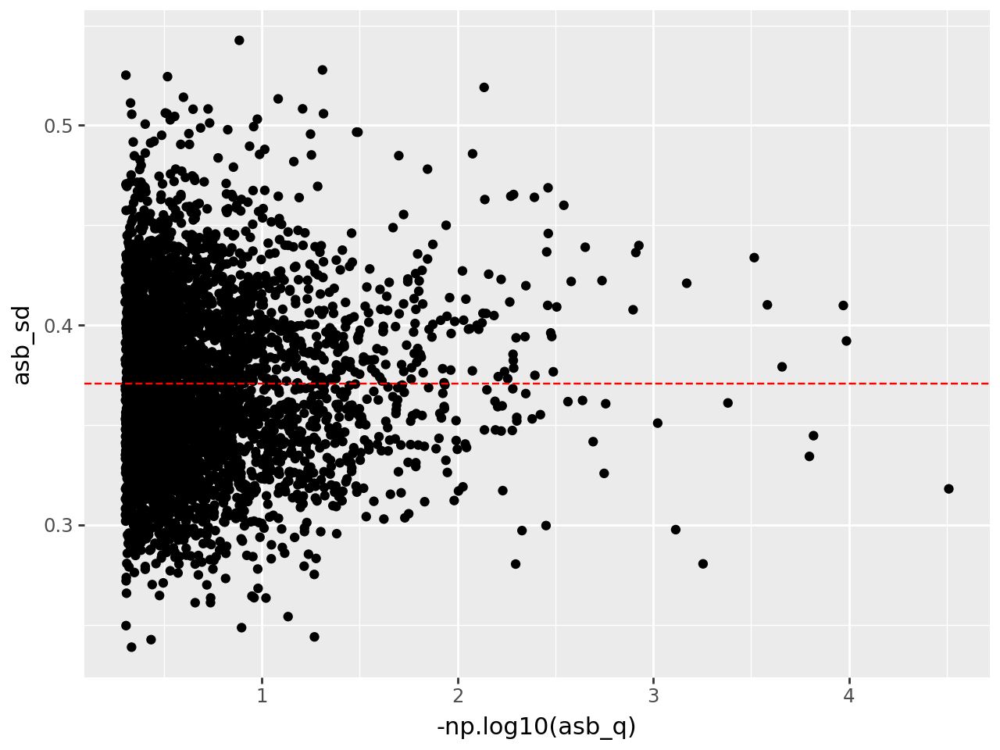

In [33]:
(ggplot(dat, aes(x = "-np.log10(asb_q)", y = "asb_sd"))+
 geom_point()+
 geom_abline(slope = 0, intercept=dat['asb_sd'].mean(), color='red', linetype='dashed')
)

/gpfs/commons/home/dmeyer/venv/poolqtl/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
/gpfs/commons/home/dmeyer/venv/poolqtl/lib/python3.12/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 1966 rows containing missing values.


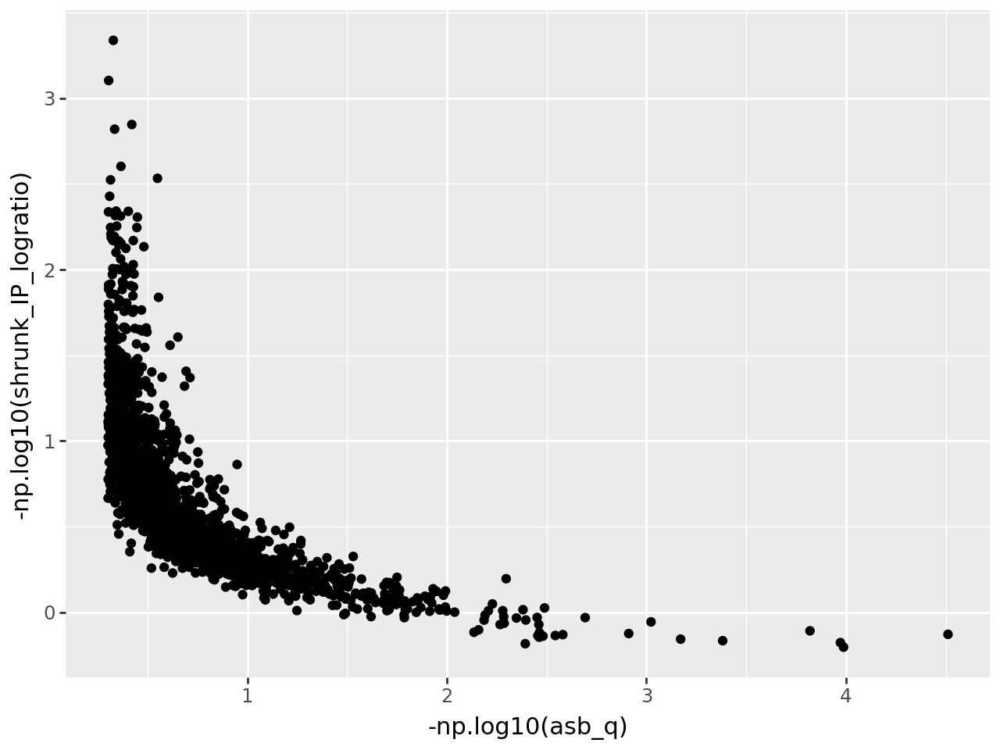

In [34]:
(ggplot(dat, aes(x = "-np.log10(asb_q)", y = "-np.log10(shrunk_IP_logratio)"))+
 geom_point()
)

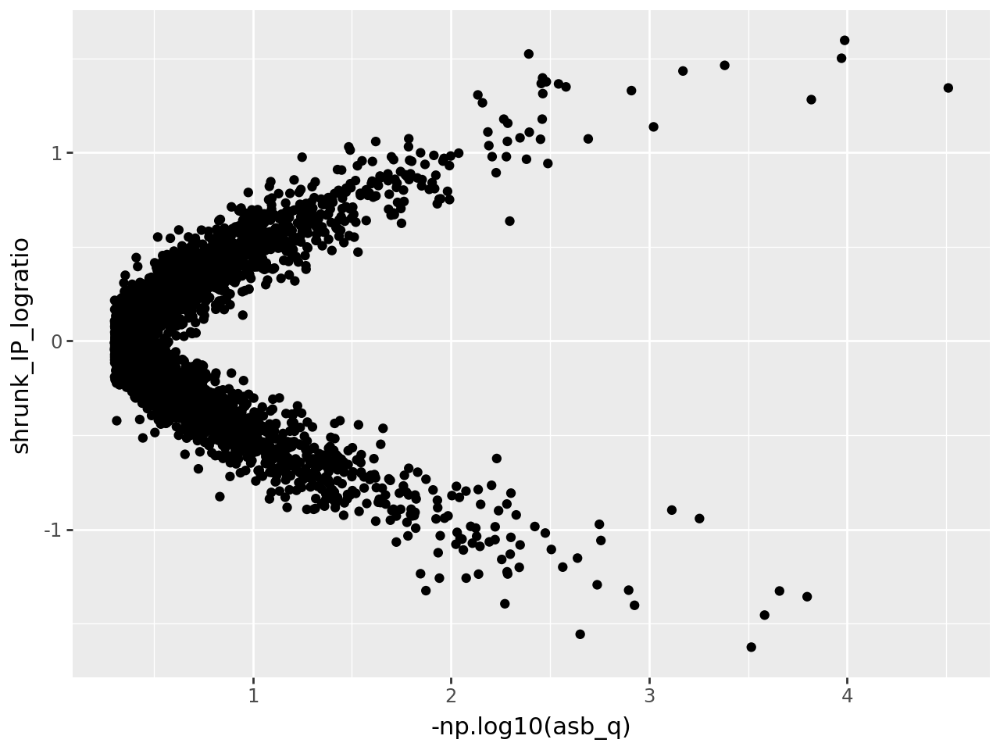

In [36]:
(ggplot(dat, aes(x = "-np.log10(asb_q)", y = "shrunk_IP_logratio"))+
 geom_point()
)

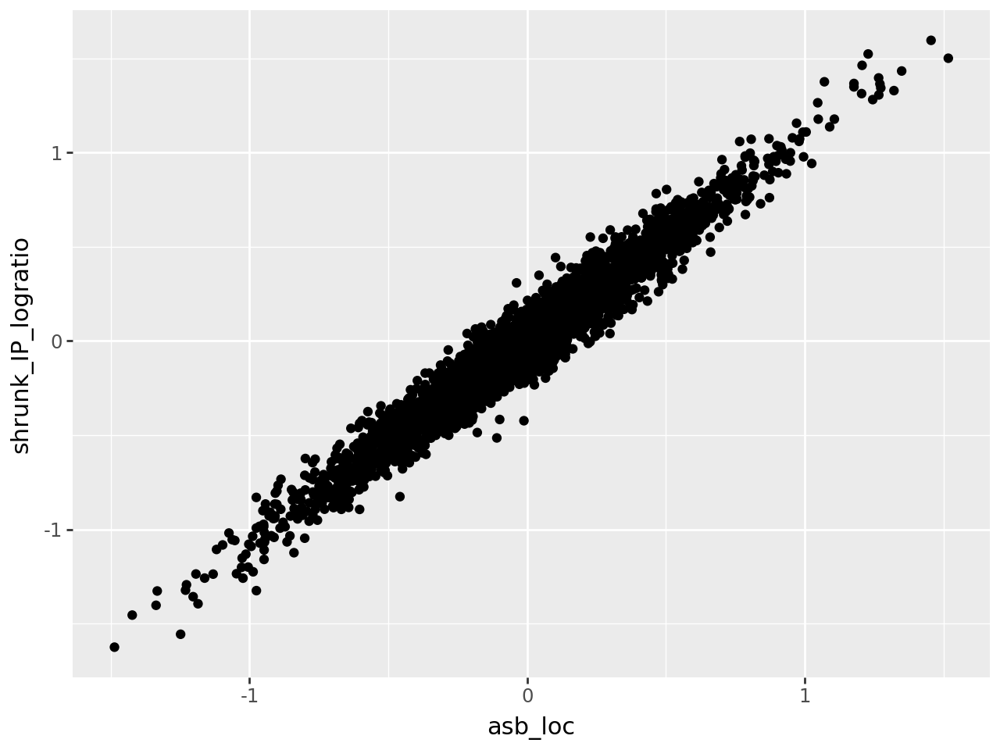

In [37]:
(ggplot(dat, aes(x = "asb_loc", y = "shrunk_IP_logratio"))+
 geom_point()
)

## Write out indel SNPs to file

In [123]:
refIndels = sanger.refAllele.str.contains(r"[ACGT][ACGT]+") 
altIndels = sanger.altAllele.str.contains(r"[ACGT][ACGT]+")
isIndel = refIndels | altIndels

In [128]:
with open("indel_snps.txt", 'w') as f:
    for x in sanger['variantID'][isIndel]:
        print(x, file=f)